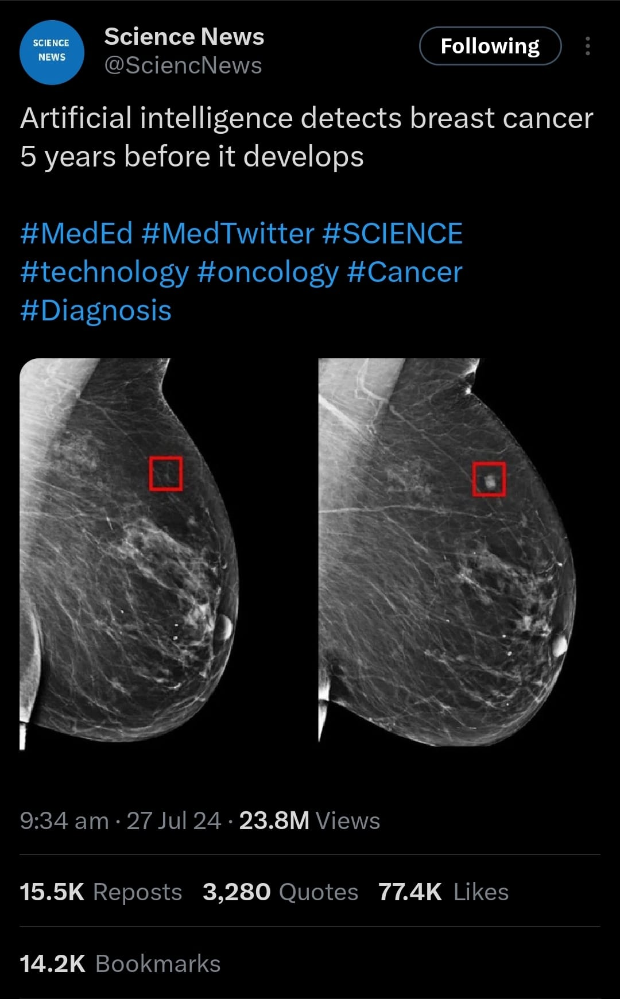

# Import Libraries

In [ ]:
!pip install visualkeras

In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import visualkeras
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


In [ ]:
# set same seed for each model
tf.random.set_seed(42)
np.random.seed(42)

In [ ]:
# Connect to kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
# Import helper_functions for later use
!wget https://raw.githubusercontent.com/databyhuseyn/DeepLearning/main/helper_functions.py

--2024-08-16 08:43:03--  https://raw.githubusercontent.com/databyhuseyn/DeepLearning/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py.1’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2024-08-16 08:43:03 (100 MB/s) - ‘helper_functions.py.1’ saved [10246/10246]



In [ ]:
# Get necessary features from helper_functions
from helper_functions import unzip_data, walk_through_dir, plot_loss_curves

# Load dataset

In [ ]:
# Download data
!kaggle datasets download -d mohammadhossein77/brain-tumors-dataset

Dataset URL: https://www.kaggle.com/datasets/mohammadhossein77/brain-tumors-dataset
License(s): CC0-1.0
 94% 207M/221M [00:00<00:00, 271MB/s]
100% 221M/221M [00:00<00:00, 236MB/s]


In [ ]:
unzip_data('/content/brain-tumors-dataset.zip')

# Create Directories

In [ ]:
import os
import shutil
import random

os.mkdir('/content/Tumor')
os.mkdir('/content/Tumor/Normal')
os.mkdir('/content/Tumor/Meningioma')
os.mkdir('/content/Tumor/Glioma')
os.mkdir('/content/Tumor/Pituitary')

In [ ]:
# Function to copy files from source to destination
def copy_files(src_dir, dst_dir):
    for filename in os.listdir(src_dir):
        src_file = os.path.join(src_dir, filename)
        dst_file = os.path.join(dst_dir, filename)
        if os.path.isfile(src_file):
            shutil.copy(src_file, dst_file)

In [ ]:
original_normal = '/content/Data/Normal'
original_glioma = '/content/Data/Tumor/glioma_tumor'
original_meningioma = '/content/Data/Tumor/meningioma_tumor'
original_pituitary = '/content/Data/Tumor/pituitary_tumor'


new_normal = '/content/Tumor/Normal'
new_meningioma = '/content/Tumor/Meningioma'
new_glioma = '/content/Tumor/Glioma'
new_pituitary = '/content/Tumor/Pituitary'

In [ ]:
# Move files from original location to new location
copy_files(original_normal, new_normal)
copy_files(original_meningioma, new_meningioma)
copy_files(original_glioma, new_glioma)
copy_files(original_pituitary, new_pituitary)

In [ ]:
import os
import shutil
import random

# Define the paths
data_dir = '/content/Tumor'  # Adjust this path to your actual data directory
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')

# Create directories for train and test datasets
os.makedirs(os.path.join(train_dir, 'glioma'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'meningioma'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'pituitary'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'normal'), exist_ok=True)

os.makedirs(os.path.join(test_dir, 'glioma'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'meningioma'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'pituitary'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'normal'), exist_ok=True)

# Define the class types
class_types = {
    'glioma': os.path.join(data_dir, 'Glioma'),
    'meningioma': os.path.join(data_dir, 'Meningioma'),
    'pituitary': os.path.join(data_dir, 'Pituitary'),
    'normal': os.path.join(data_dir, 'Normal')
}

# Function to split data into train and test
def split_data(src_dir, dest_train_dir, dest_test_dir, split_ratio=0.8):
    files = os.listdir(src_dir)
    random.shuffle(files)
    split_point = int(len(files) * split_ratio)

    train_files = files[:split_point]
    test_files = files[split_point:]

    for file in train_files:
        shutil.copy(os.path.join(src_dir, file), os.path.join(dest_train_dir, file))

    for file in test_files:
        shutil.copy(os.path.join(src_dir, file), os.path.join(dest_test_dir, file))

# Split the data for each class
for class_name, class_dir in class_types.items():
    split_data(class_dir,
               os.path.join(train_dir, class_name),
               os.path.join(test_dir, class_name))

print("Data split into train and test directories successfully.")


Data split into train and test directories successfully.


# Data Augmentation

In [ ]:
import tensorflow as tf
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Directory structure
train_dir = '/content/Tumor/train'
validation_dir = '/content/Tumor/test'

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

Found 17335 images belonging to 4 classes.
Found 4337 images belonging to 4 classes.


# Model CheckPoint

In [ ]:
import os

# Create a function to implement a ModelCheckpoint callback with a specific filename
def create_model_checkpoint(model_name, save_path='model_experiments'):
  return tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(save_path, model_name),   # create filepath to save model
                                            verbose=0,    # only output a limited amount of text
                                            save_best_only=True)  # save only the best model to file

In [ ]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint('My_Checkpoints',
                                                   save_weights_only=True)
early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=3,
                                                     restore_best_weights=True)

# Baseline Model

In [ ]:
# Create Baseline Model

model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(4, activation='softmax')
], name='baseline_model')

In [ ]:
model.summary()

Model: "baseline_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_37 (Conv2D)          (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 63, 63, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_39 (Conv2D)          (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 14, 14, 128)    

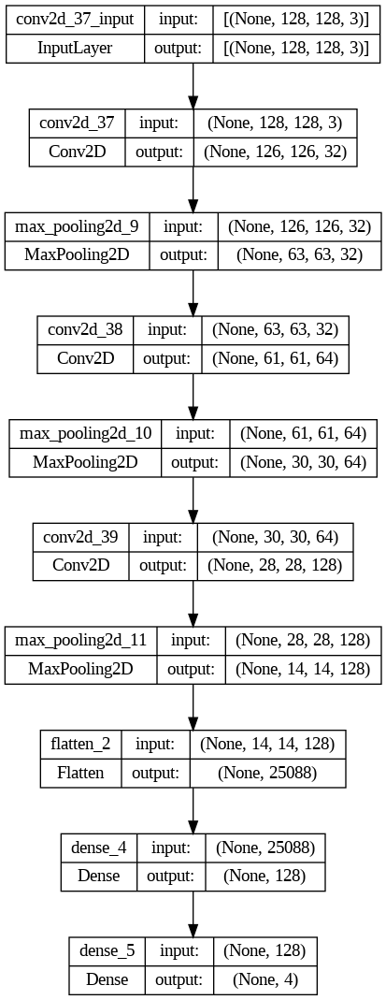

In [ ]:
# Visualize model
from keras.utils import plot_model

plot_model(model, show_shapes = True)

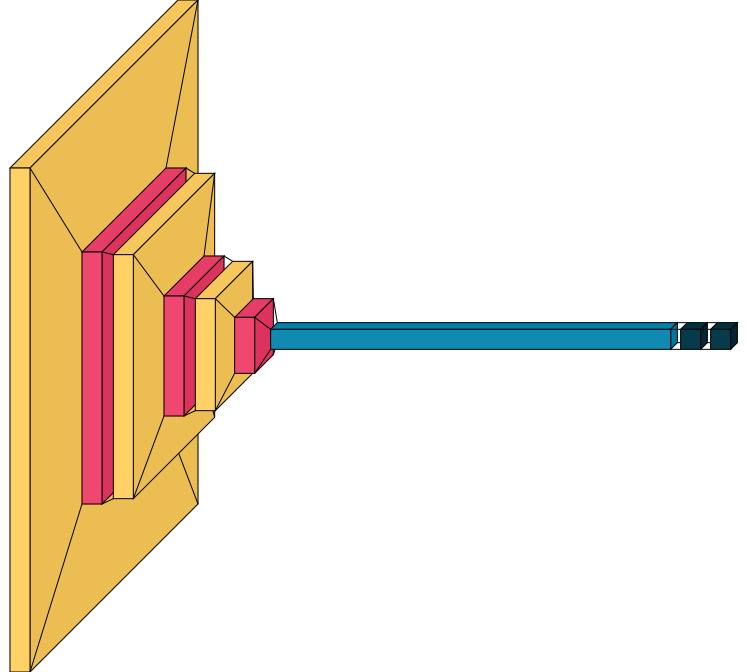

In [ ]:
visualkeras.layered_view(model)

In [ ]:
# Create Metrics

from tensorflow.keras.metrics import Precision, Recall, AUC

import tensorflow as tf
from tensorflow.keras import backend as K

def f1_score(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2 * ((precision * recall) / (precision + recall + K.epsilon()))

In [ ]:
# Compile Model
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        AUC(name='auc'),
        f1_score
    ]
)

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=10,
    callbacks=[create_model_checkpoint(model_name=model.name)])

Epoch 1/10
541/541 [==============================] - 28s 47ms/step - loss: 0.7510 - accuracy: 0.6892 - precision: 0.7590 - recall: 0.5912 - auc: 0.9027 - f1_score: 0.6453 - val_loss: 0.5073 - val_accuracy: 0.8030 - val_precision: 0.8320 - val_recall: 0.7567 - val_auc: 0.9544 - val_f1_score: 0.7880
Epoch 2/10
541/541 [==============================] - 27s 50ms/step - loss: 0.3255 - accuracy: 0.8783 - precision: 0.8926 - recall: 0.8626 - auc: 0.9805 - f1_score: 0.8769 - val_loss: 0.2415 - val_accuracy: 0.9088 - val_precision: 0.9149 - val_recall: 0.9035 - val_auc: 0.9888 - val_f1_score: 0.9090
Epoch 3/10
541/541 [==============================] - 27s 49ms/step - loss: 0.1486 - accuracy: 0.9472 - precision: 0.9512 - recall: 0.9434 - auc: 0.9955 - f1_score: 0.9472 - val_loss: 0.1673 - val_accuracy: 0.9428 - val_precision: 0.9462 - val_recall: 0.9400 - val_auc: 0.9935 - val_f1_score: 0.9430
Epoch 4/10
541/541 [==============================] - 24s 44ms/step - loss: 0.0627 - accuracy: 0.979

In [ ]:
model.evaluate(validation_generator)

136/136 [==============================] - 4s 31ms/step - loss: 0.1610 - accuracy: 0.9640 - precision: 0.9642 - recall: 0.9631 - auc: 0.9922 - f1_score: 0.9637


[0.16102342307567596,
 0.9640304446220398,
 0.9642197489738464,
 0.9631081223487854,
 0.9922388195991516,
 0.9637385010719299]

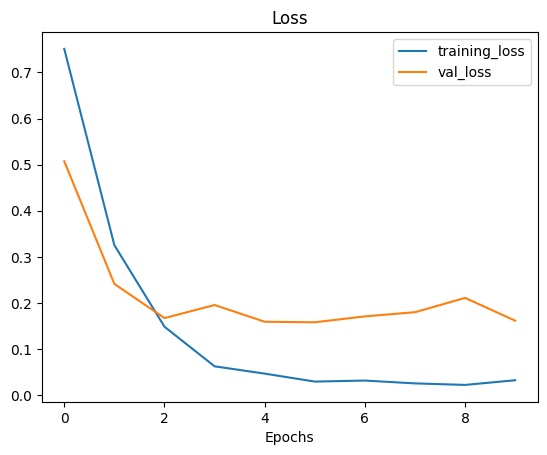

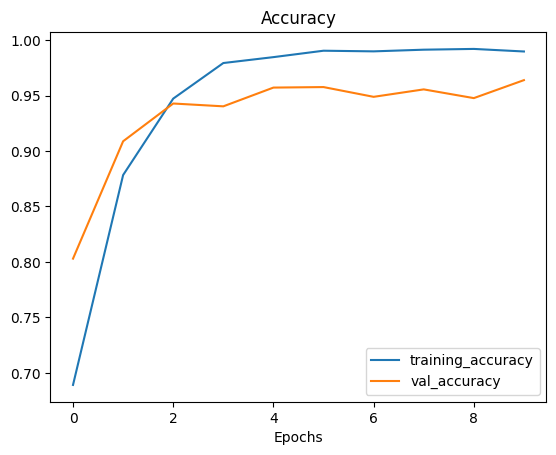

In [ ]:
plot_loss_curves(history)

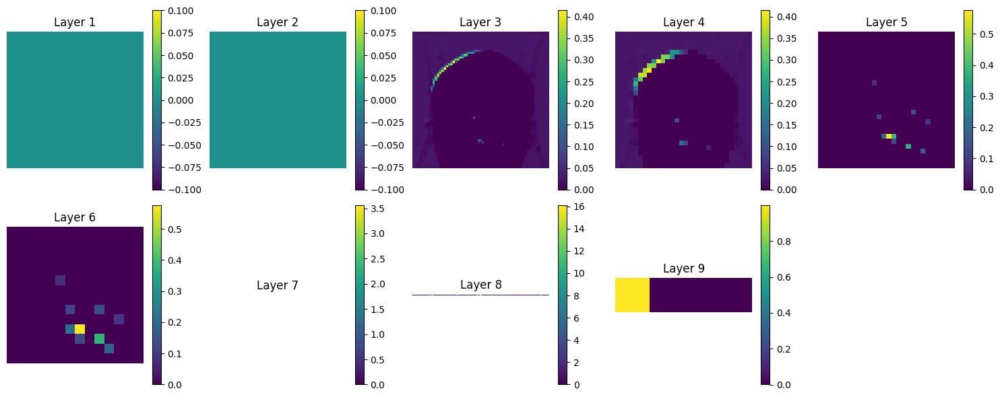

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import tensorflow as tf

# Get a batch of images from the validation generator
sample_batch = next(validation_generator)
sample_image = sample_batch[0][0]  # Get the first image from the batch

# Ensure the sample image is in the correct shape
sample_image = sample_image.reshape((1, *sample_image.shape))

# Define the predict function outside the loop to avoid retracing
@tf.function
def get_intermediate_output(intermediate_model, input_data):
    return intermediate_model(input_data)

# Determine the number of layers
num_layers = len(model.layers)

# Calculate the number of rows and columns for the subplots
num_cols = 5
num_rows = (num_layers // num_cols) + (1 if num_layers % num_cols != 0 else 0)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over layers
for i in range(num_layers):
    # Get the output of the current layer
    layer_output = model.layers[i].output

    # Create a new model that will return the output of the current layer given an input
    intermediate_model = Model(inputs=model.input, outputs=layer_output)

    # Get the output of the current layer
    intermediate_output = get_intermediate_output(intermediate_model, sample_image).numpy()

    # Handle different output shapes
    if len(intermediate_output.shape) == 4:  # For Conv2D layers
        output_image = intermediate_output[0, :, :, 0]
    elif len(intermediate_output.shape) == 2:  # For Dense layers
        output_image = intermediate_output[0].reshape((1, -1))  # Reshape to 2D for visualization
    else:
        continue  # Skip layers with unsupported output shapes

    # Visualize the output using plt.imshow
    ax = axes[i]  # Get the appropriate subplot
    ax.imshow(output_image, cmap='viridis')
    ax.set_title(f'Layer {i+1}')
    ax.axis('off')
    fig.colorbar(ax.imshow(output_image, cmap='viridis'), ax=ax)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
def create_confusion_matrix(model):
  # Get predictions from the model
  predictions = model.predict(validation_generator)
  predicted_classes = np.argmax(predictions, axis=1)

  # Get true labels
  true_classes = validation_generator.classes
  class_labels = list(validation_generator.class_indices.keys())

  # Create confusion matrix
  cm = confusion_matrix(true_classes, predicted_classes)

  # Display confusion matrix
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
  disp.plot(cmap='Blues', values_format='d')
  plt.title('Confusion Matrix')
  plt.show()



136/136 [==============================] - 5s 35ms/step


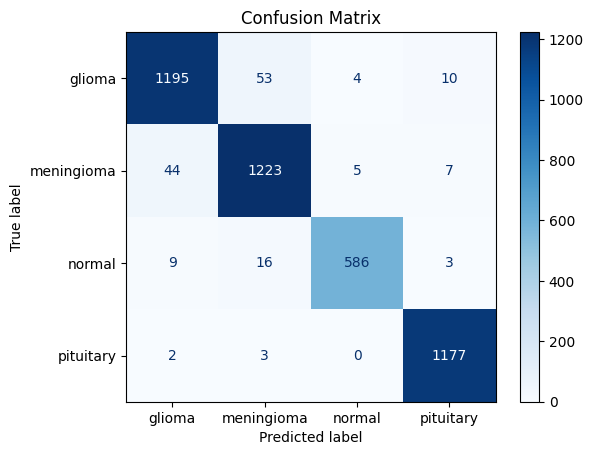

In [ ]:
create_confusion_matrix(model)

# U-Net model implementation



> UNet Model paper

Olaf Ronneberger, Philipp Fischer, Thomas Brox. "U-Net: Convolutional Networks for Biomedical Image Segmentation" (2015) https://arxiv.org/abs/1505.04597v1





In [ ]:
tf.keras.backend.clear_session()
inputs = tf.keras.layers.Input(shape=(128, 128, 3))
conv2d_0 = tf.keras.layers.Conv2D(filters=64/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
conv2d_1 = tf.keras.layers.Conv2D(filters=64/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_0)            # birleshdir
max_pool_0 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv2d_1)
conv2d_2 = tf.keras.layers.Conv2D(filters=128/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(max_pool_0)
conv2d_3 = tf.keras.layers.Conv2D(filters=128/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_2)            # birleshdir
max_pool_1 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv2d_3)
conv2d_4 = tf.keras.layers.Conv2D(filters=256/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(max_pool_1)
conv2d_5 = tf.keras.layers.Conv2D(filters=256/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_4)            # birleshdir
max_pool_2 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv2d_5)
conv2d_6 = tf.keras.layers.Conv2D(filters=512/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(max_pool_2)
conv2d_7 = tf.keras.layers.Conv2D(filters=512/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_6)            # birleshdir
max_pool_3 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv2d_7)
conv2d_8 = tf.keras.layers.Conv2D(filters=512/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(max_pool_3)
conv2d_9 = tf.keras.layers.Conv2D(filters=512/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_8)
up_conv_0 = tf.keras.layers.Conv2DTranspose(filters=1024/2, kernel_size=(2, 2), strides=(2, 2), padding='same')(conv2d_9)
conv2d_7 = tf.image.resize(conv2d_7, size=(up_conv_0.shape[1],
                                           up_conv_0.shape[2]))
concat_0 = tf.keras.layers.concatenate([conv2d_7, up_conv_0], axis=3)
conv2d_10 = tf.keras.layers.Conv2D(filters=1024/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(concat_0)
conv2d_11 = tf.keras.layers.Conv2D(filters=512/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_10)
up_conv_1 = tf.keras.layers.Conv2DTranspose(filters = 512/2, kernel_size=(2, 2), strides=(2, 2), padding='same')(conv2d_11)
conv2d_5 = tf.image.resize(conv2d_5, size=(up_conv_1.shape[1],
                                           up_conv_1.shape[2]))
concat_1 = tf.keras.layers.concatenate([conv2d_5, up_conv_1], axis=3)
conv2d_12 = tf.keras.layers.Conv2D(filters=512/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(concat_1)
conv2d_13 = tf.keras.layers.Conv2D(filters=128/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_12)
up_conv_2 = tf.keras.layers.Conv2DTranspose(filters=256/2, kernel_size=(2, 2), strides=(2, 2), padding='same')(conv2d_13)
conv2d_3 = tf.image.resize(conv2d_3, size=(up_conv_2.shape[1],
                                           up_conv_2.shape[2]))
concat_2 = tf.keras.layers.concatenate([conv2d_3, up_conv_2], axis=3)
conv2d_14 = tf.keras.layers.Conv2D(filters=256/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(concat_2)
conv2d_15 = tf.keras.layers.Conv2D(filters=128/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_14)
up_conv_3 = tf.keras.layers.Conv2DTranspose(filters = 128/2, kernel_size=(2, 2), strides=(2, 2), padding='same')(conv2d_15)
conv2d_1 = tf.image.resize(conv2d_1, size=(up_conv_3.shape[1],
                                           up_conv_3.shape[2]))
concat_3 = tf.keras.layers.concatenate([conv2d_1, up_conv_3], axis=3)
conv2d_16 = tf.keras.layers.Conv2D(filters=128/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(concat_3)
conv2d_17 = tf.keras.layers.Conv2D(filters=64/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_16)
conv2d_18 = tf.keras.layers.Conv2D(filters=64/2, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2d_17)
flattened = tf.keras.layers.Flatten()(conv2d_18)
dense_0 = tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_normal')(flattened)
outputs = tf.keras.layers.Dense(4, activation='softmax')(dense_0)
model_unet = tf.keras.Model(inputs, outputs, name='Unet-remake')

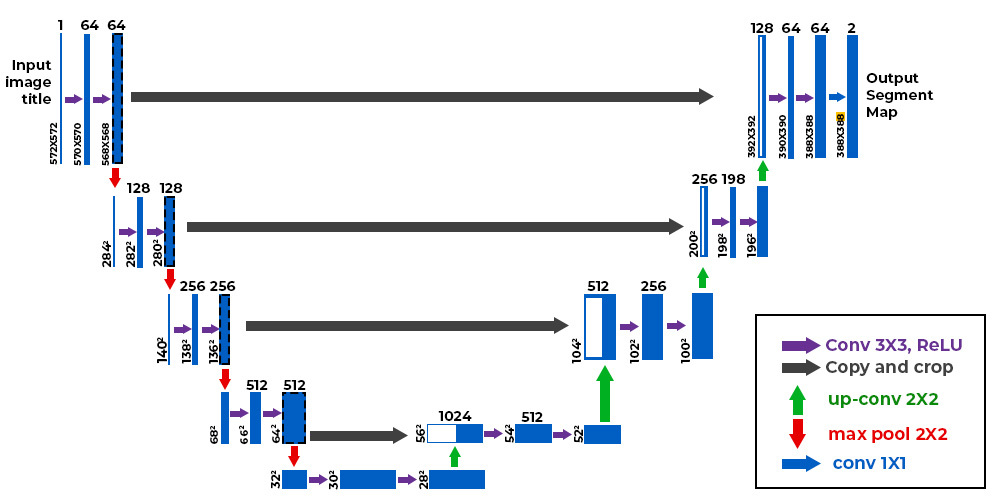

In [ ]:
model_unet.summary()

Model: "Unet-remake"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 32)         896       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 32)         9248      ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)           0         ['conv2d_1[0][0]']            
 D)                                                                                     

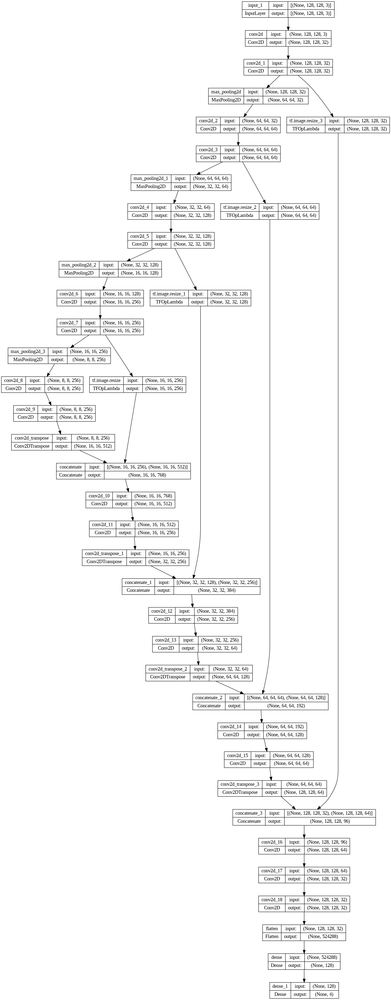

In [ ]:
from keras.utils import plot_model

plot_model(model_unet, show_shapes = True)

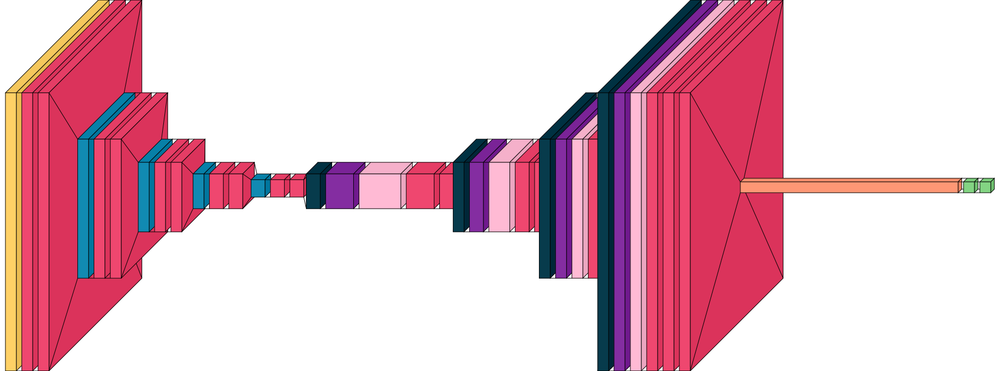

In [ ]:
visualkeras.layered_view(model_unet)

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

model_unet.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        AUC(name='auc'),
        f1_score
    ]
)

In [ ]:
model_unet_history = model_unet.fit(train_generator,
                                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                                    validation_data=validation_generator,
                                    validation_steps=validation_generator.samples // validation_generator.batch_size,
                                    epochs=10,
                                    callbacks=[checkpoint_cb, early_stopping_cb, create_model_checkpoint(model_name=model_unet.name)])

Epoch 1/10
541/541 [==============================] - 202s 316ms/step - loss: 0.8683 - accuracy: 0.7265 - precision: 0.7956 - recall: 0.6386 - auc: 0.9178 - f1_score: 0.6865 - val_loss: 0.3516 - val_accuracy: 0.8706 - val_precision: 0.8851 - val_recall: 0.8539 - val_auc: 0.9773 - val_f1_score: 0.8686
Epoch 2/10
541/541 [==============================] - 160s 297ms/step - loss: 0.1674 - accuracy: 0.9429 - precision: 0.9473 - recall: 0.9379 - auc: 0.9941 - f1_score: 0.9425 - val_loss: 0.2319 - val_accuracy: 0.9273 - val_precision: 0.9335 - val_recall: 0.9229 - val_auc: 0.9884 - val_f1_score: 0.9281
Epoch 3/10
541/541 [==============================] - 154s 285ms/step - loss: 0.0464 - accuracy: 0.9851 - precision: 0.9858 - recall: 0.9844 - auc: 0.9992 - f1_score: 0.9851 - val_loss: 0.3598 - val_accuracy: 0.9090 - val_precision: 0.9106 - val_recall: 0.9079 - val_auc: 0.9800 - val_f1_score: 0.9092
Epoch 4/10
541/541 [==============================] - 159s 295ms/step - loss: 0.0311 - accurac

In [ ]:
model_unet.evaluate(validation_generator)

Exception ignored in: <function _xla_gc_callback at 0x7b50dc8d9990>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 98, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


136/136 [==============================] - 13s 95ms/step - loss: 0.2314 - accuracy: 0.9274 - precision: 0.9335 - recall: 0.9230 - auc: 0.9884 - f1_score: 0.9282


[0.23137138783931732,
 0.9273691773414612,
 0.9335354566574097,
 0.92298823595047,
 0.9884005784988403,
 0.9281615614891052]

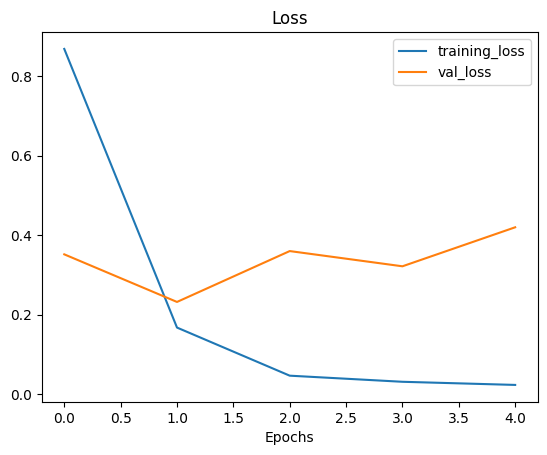

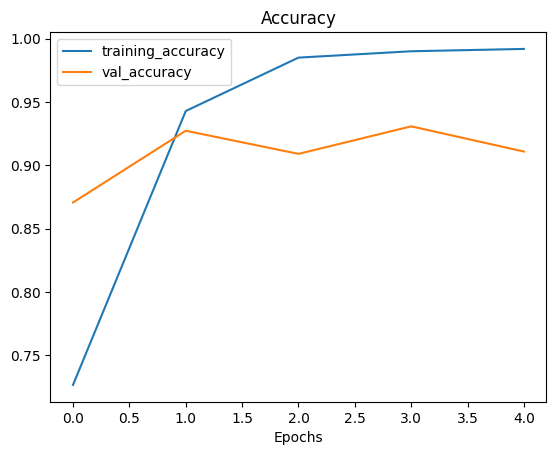

In [ ]:
plot_loss_curves(model_unet_history)

136/136 [==============================] - 9s 67ms/step


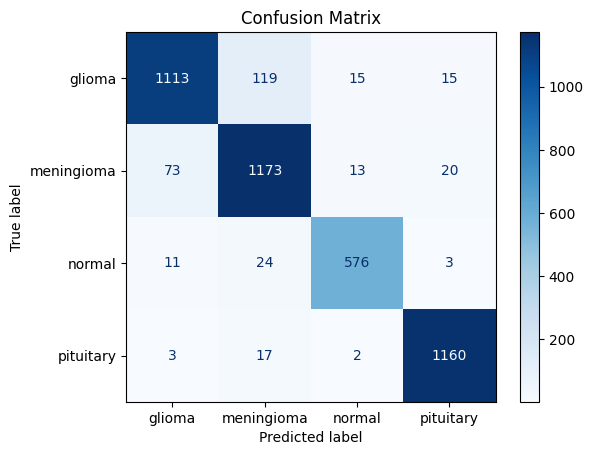

Text(0.5, 1.0, 'UNET')

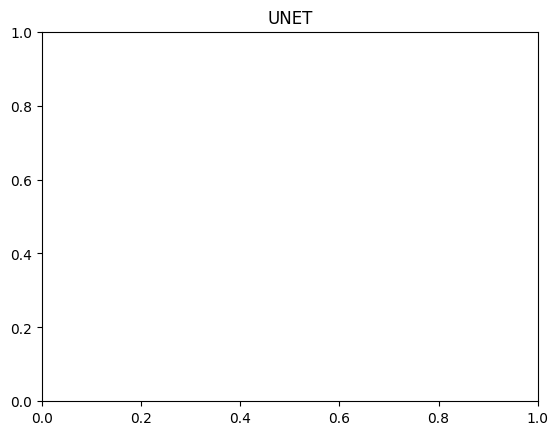

In [ ]:
create_confusion_matrix(model_unet)

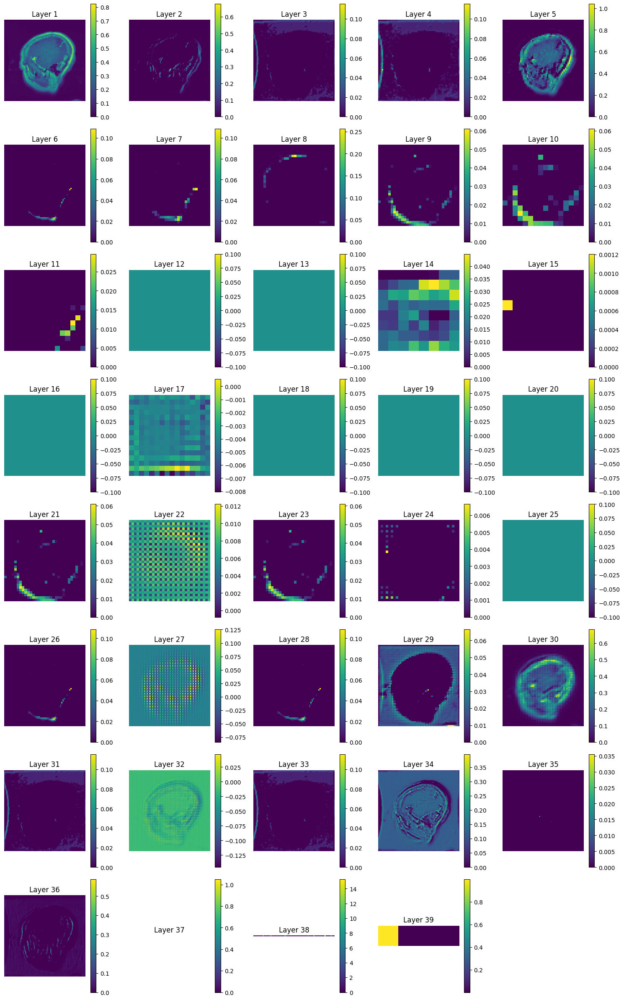

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import tensorflow as tf

# Get a batch of images from the validation generator
sample_batch = next(validation_generator)
sample_image = sample_batch[0][0]  # Get the first image from the batch

# Ensure the sample image is in the correct shape
sample_image = sample_image.reshape((1, *sample_image.shape))

# Define the predict function outside the loop to avoid retracing
@tf.function
def get_intermediate_output(intermediate_model, input_data):
    return intermediate_model(input_data)

# Determine the number of layers
num_layers = len(model_unet.layers)

# Calculate the number of rows and columns for the subplots
num_cols = 5
num_rows = (num_layers // num_cols) + (1 if num_layers % num_cols != 0 else 0)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over layers
for i in range(num_layers):
    # Get the output of the current layer
    layer_output = model_unet.layers[i].output

    # Create a new model that will return the output of the current layer given an input
    intermediate_model = Model(inputs=model_unet.input, outputs=layer_output)

    # Get the output of the current layer
    intermediate_output = get_intermediate_output(intermediate_model, sample_image).numpy()

    # Handle different output shapes
    if len(intermediate_output.shape) == 4:  # For Conv2D layers
        output_image = intermediate_output[0, :, :, 0]
    elif len(intermediate_output.shape) == 2:  # For Dense layers
        output_image = intermediate_output[0].reshape((1, -1))  # Reshape to 2D for visualization
    else:
        continue  # Skip layers with unsupported output shapes

    # Visualize the output using plt.imshow
    ax = axes[i]  # Get the appropriate subplot
    ax.imshow(output_image, cmap='viridis')
    ax.set_title(f'Layer {i+1}')
    ax.axis('off')
    fig.colorbar(ax.imshow(output_image, cmap='viridis'), ax=ax)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Inception Model v2 implementation



> Inception Model v2 paper

Christian Szegedy, et al. "Going Deeper with Convolutions" (2015) https://arxiv.org/abs/1409.4842




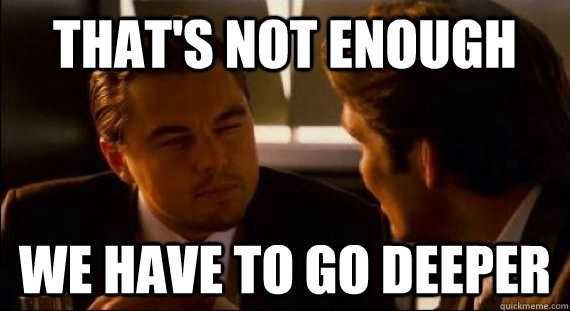

In [ ]:
import tensorflow as tf

def inception(layer, oxo, txt_red, txt, fxf_red, fxf, oxo_sec):
    conv1_1 = tf.keras.layers.Conv2D(oxo, kernel_size=(1, 1), strides=1, padding='same', activation='relu')(layer)

    conv3_3_red = tf.keras.layers.Conv2D(txt_red, kernel_size=(1, 1), strides=1, padding='same', activation='relu')(layer)
    conv3_3 = tf.keras.layers.Conv2D(txt, kernel_size=(3, 3), strides=1, padding='same', activation='relu')(conv3_3_red)

    conv5_5_red = tf.keras.layers.Conv2D(fxf_red, kernel_size=(1, 1), strides=1, padding='same', activation='relu')(layer)
    conv5_5 = tf.keras.layers.Conv2D(fxf, kernel_size=(5, 5), strides=1, padding='same', activation='relu')(conv5_5_red)

    max_pool = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=1, padding='same')(layer)
    conv1_1_sec = tf.keras.layers.Conv2D(oxo_sec, kernel_size=(1, 1), strides=1, padding='same', activation='relu')(max_pool)

    final_layer = tf.keras.layers.Concatenate(axis=-1)([conv1_1, conv3_3, conv5_5, conv1_1_sec])
    return final_layer

tf.keras.backend.clear_session()
inputs = tf.keras.layers.Input(shape=(128, 128, 3))

conv0 = tf.keras.layers.Conv2D(filters=64, kernel_size=(7, 7), strides=2, activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
max_pool0 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(conv0)
norm0 = tf.keras.layers.BatchNormalization()(max_pool0)

conv1 = tf.keras.layers.Conv2D(filters=64, kernel_size=(1, 1), strides=1, activation='relu', kernel_initializer='he_normal', padding='valid')(norm0)
conv2 = tf.keras.layers.Conv2D(filters=192, kernel_size=(3, 3), strides=1, activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
norm1 = tf.keras.layers.BatchNormalization()(conv2)
max_pool1 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(norm1)

inception_0 = inception(max_pool1, 64, 96, 128, 16, 32, 32)
inception_1 = inception(inception_0, 128, 128, 192, 32, 96, 64)
max_pool2 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(inception_1)
inception_2 = inception(max_pool2, 192, 96, 208, 16, 48, 64)      # avgpooling
avg_pool0 =  tf.keras.layers.MaxPooling2D(pool_size=(5, 5), strides=3, padding='valid')(inception_2)
soft_conv0 = tf.keras.layers.Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same', activation='relu', kernel_initializer='he_normal')(avg_pool0)
flatten0 = tf.keras.layers.Flatten()(soft_conv0)
fc0 = tf.keras.layers.Dense(32, activation='relu', kernel_initializer='he_normal')(flatten0)
side_output0 = tf.keras.layers.Dense(4, activation='softmax')(fc0)


inception_3 = inception(inception_2, 160, 112, 224, 24, 64, 64)
inception_4 = inception(inception_3, 128, 128, 256, 24, 64, 64)
inception_5 = inception(inception_4, 112, 144, 288, 32, 64, 64)  # avgpooling
avg_pool1 =  tf.keras.layers.MaxPooling2D(pool_size=(5, 5), strides=3, padding='valid')(inception_5)
soft_conv1 = tf.keras.layers.Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same', activation='relu', kernel_initializer='he_normal')(avg_pool1)
flatten1 = tf.keras.layers.Flatten()(soft_conv1)
fc1 = tf.keras.layers.Dense(32, activation='relu', kernel_initializer='he_normal')(flatten1)
side_output1 = tf.keras.layers.Dense(4, activation='softmax')(fc1)



inception_6 = inception(inception_5, 256, 160, 320, 32, 128, 128)
max_pool3 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(inception_6)
inception_7 = inception(max_pool3, 256, 160, 320, 32, 128, 128)
inception_8 = inception(inception_7, 384, 192, 384, 48, 128, 128)
avg_pool2 = tf.keras.layers.AveragePooling2D(pool_size=(4, 4), strides=1, padding='valid')(inception_8)
dropout = tf.keras.layers.Dropout(rate=0.4)(avg_pool2)
flatten2 = tf.keras.layers.Flatten()(dropout)
output = tf.keras.layers.Dense(4, activation='softmax')(flatten2)

inception_model = tf.keras.models.Model(inputs=inputs, outputs=[output, side_output0, side_output1], name='inception_model')
inception_model.summary()

Model: "inception_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 64, 64, 64)           9472      ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 32, 32, 64)           0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 batch_normalization (Batch  (None, 32, 32, 64)           256       ['max_pooling2d[



> A block of Inception Model



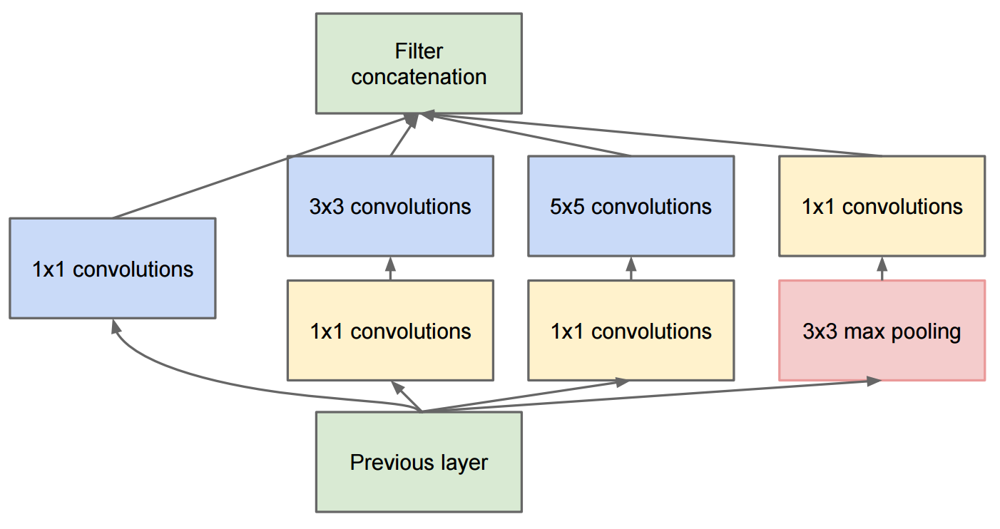

> Inception Model Architecture

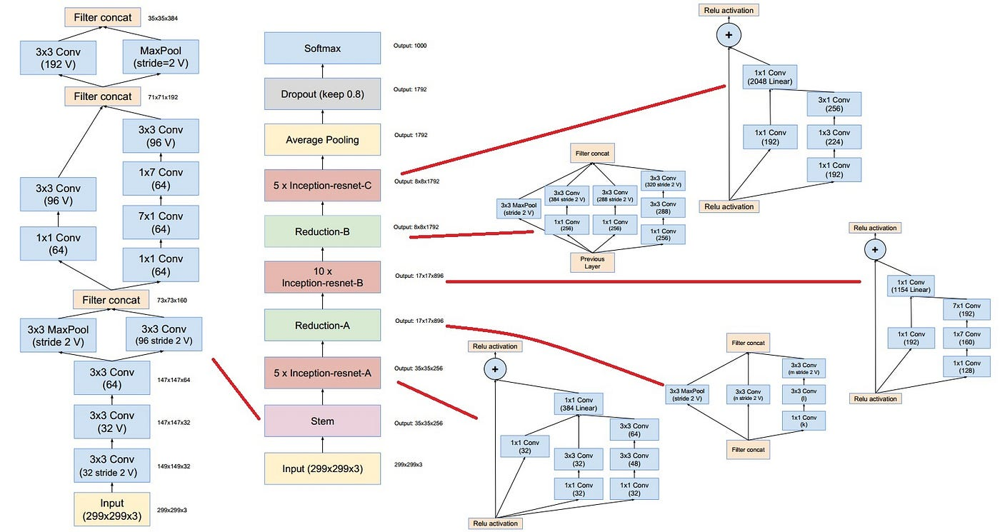

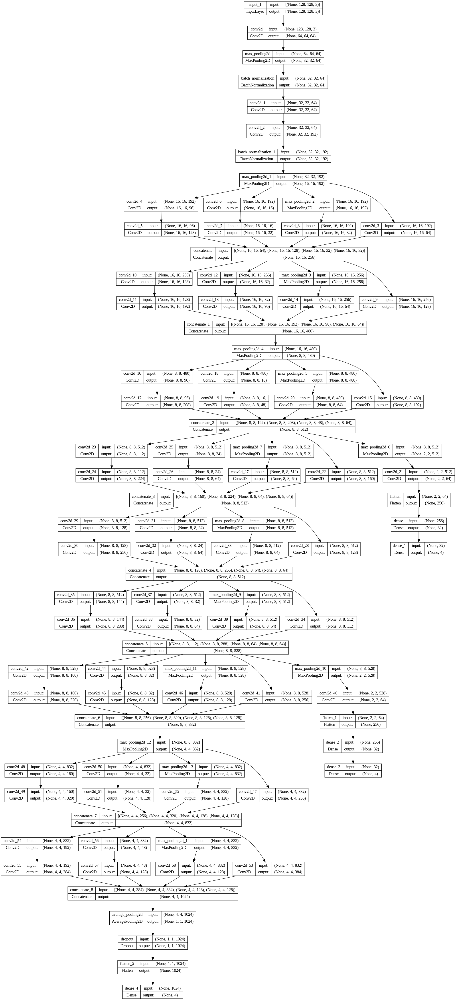

In [ ]:
tf.keras.utils.plot_model(inception_model, show_shapes = True)

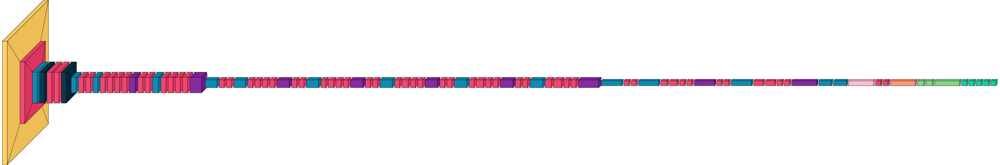

In [ ]:
visualkeras.layered_view(inception_model)

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, AUC

import tensorflow as tf
from tensorflow.keras import backend as K

def f1_score(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2 * ((precision * recall) / (precision + recall + K.epsilon()))

inception_model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        AUC(name='auc'),
        f1_score
    ]
)

In [ ]:
inception_model_history = inception_model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=10,                                        # adjust epochs as needed
    callbacks=[checkpoint_cb, early_stopping_cb, create_model_checkpoint(model_name=inception_model.name)])


Epoch 1/10
541/541 [==============================] - 89s 115ms/step - loss: 2.7462 - dense_4_loss: 0.9846 - dense_1_loss: 0.8466 - dense_3_loss: 0.9150 - dense_4_accuracy: 0.5676 - dense_4_precision: 0.6919 - dense_4_recall: 0.3796 - dense_4_auc: 0.8285 - dense_4_f1_score: 0.4450 - dense_1_accuracy: 0.6427 - dense_1_precision: 0.7257 - dense_1_recall: 0.5225 - dense_1_auc: 0.8754 - dense_1_f1_score: 0.5829 - dense_3_accuracy: 0.6027 - dense_3_precision: 0.7228 - dense_3_recall: 0.4380 - dense_3_auc: 0.8526 - dense_3_f1_score: 0.5020 - val_loss: 2.3617 - val_dense_4_loss: 0.9152 - val_dense_1_loss: 0.6472 - val_dense_3_loss: 0.7993 - val_dense_4_accuracy: 0.6352 - val_dense_4_precision: 0.6955 - val_dense_4_recall: 0.5352 - val_dense_4_auc: 0.8580 - val_dense_4_f1_score: 0.6037 - val_dense_1_accuracy: 0.7766 - val_dense_1_precision: 0.8514 - val_dense_1_recall: 0.6620 - val_dense_1_auc: 0.9376 - val_dense_1_f1_score: 0.7430 - val_dense_3_accuracy: 0.6905 - val_dense_3_precision: 0.7458

In [ ]:
create_confusion_matrix(inception_model)

val_dense_3_f1_score: 0.9292

val_dense_1_f1_score: 0.9315

val_dense_4_f1_score: 0.9270

dense_3_f1_score: 0.9666

dense_1_f1_score: 0.9701

dense_4_f1_score: 0.9627

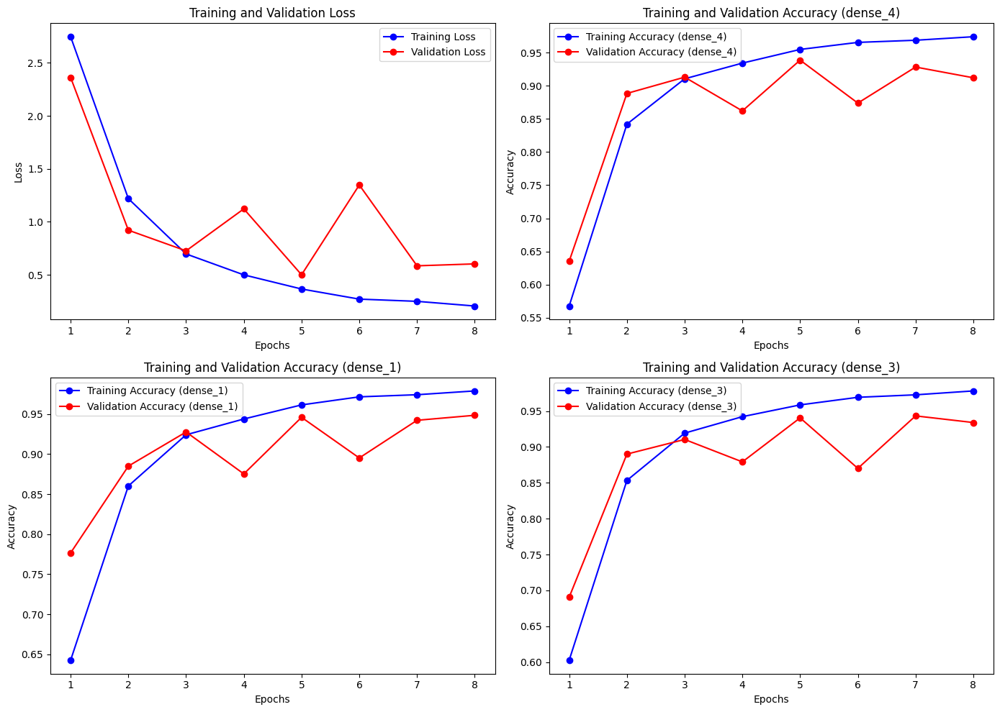

In [ ]:
import matplotlib.pyplot as plt

# Data from the model history
train_loss = inception_model_history.history['loss']
train_acc_dense4 = inception_model_history.history['dense_4_accuracy']
train_acc_dense1 = inception_model_history.history['dense_1_accuracy']
train_acc_dense3 = inception_model_history.history['dense_3_accuracy']

val_loss = inception_model_history.history['val_loss']
val_acc_dense4 = inception_model_history.history['val_dense_4_accuracy']
val_acc_dense1 = inception_model_history.history['val_dense_1_accuracy']
val_acc_dense3 = inception_model_history.history['val_dense_3_accuracy']

epochs = range(1, len(train_loss) + 1)

# Plotting the figures
plt.figure(figsize=(14, 10))

# Plotting loss
plt.subplot(2, 2, 1)
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting accuracy for dense_4
plt.subplot(2, 2, 2)
plt.plot(epochs, train_acc_dense4, 'bo-', label='Training Accuracy (dense_4)')
plt.plot(epochs, val_acc_dense4, 'ro-', label='Validation Accuracy (dense_4)')
plt.title('Training and Validation Accuracy (dense_4)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plotting accuracy for dense_1
plt.subplot(2, 2, 3)
plt.plot(epochs, train_acc_dense1, 'bo-', label='Training Accuracy (dense_1)')
plt.plot(epochs, val_acc_dense1, 'ro-', label='Validation Accuracy (dense_1)')
plt.title('Training and Validation Accuracy (dense_1)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plotting accuracy for dense_3
plt.subplot(2, 2, 4)
plt.plot(epochs, train_acc_dense3, 'bo-', label='Training Accuracy (dense_3)')
plt.plot(epochs, val_acc_dense3, 'ro-', label='Validation Accuracy (dense_3)')
plt.title('Training and Validation Accuracy (dense_3)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


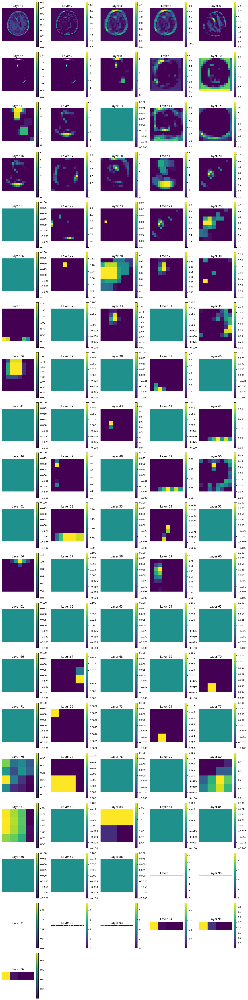

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import tensorflow as tf

# Get a batch of images from the validation generator
sample_batch = next(validation_generator)
sample_image = sample_batch[0][0]  # Get the first image from the batch

# Ensure the sample image is in the correct shape
sample_image = sample_image.reshape((1, *sample_image.shape))

# Define the predict function outside the loop to avoid retracing
@tf.function
def get_intermediate_output(intermediate_model, input_data):
    return intermediate_model(input_data)

# Determine the number of layers
num_layers = len(inception_model.layers)

# Calculate the number of rows and columns for the subplots
num_cols = 5
num_rows = (num_layers // num_cols) + (1 if num_layers % num_cols != 0 else 0)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over layers
for i in range(num_layers):
    # Get the output of the current layer
    layer_output = inception_model.layers[i].output

    # Create a new model that will return the output of the current layer given an input
    intermediate_model = Model(inputs=inception_model.input, outputs=layer_output)

    # Get the output of the current layer
    intermediate_output = get_intermediate_output(intermediate_model, sample_image).numpy()

    # Handle different output shapes
    if len(intermediate_output.shape) == 4:  # For Conv2D layers
        output_image = intermediate_output[0, :, :, 0]
    elif len(intermediate_output.shape) == 2:  # For Dense layers
        output_image = intermediate_output[0].reshape((1, -1))  # Reshape to 2D for visualization
    else:
        continue  # Skip layers with unsupported output shapes

    # Visualize the output using plt.imshow
    ax = axes[i]  # Get the appropriate subplot
    ax.imshow(output_image, cmap='viridis')
    ax.set_title(f'Layer {i+1}')
    ax.axis('off')
    fig.colorbar(ax.imshow(output_image, cmap='viridis'), ax=ax)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Attention U-Net: Learning Where to Look

> Attention UNet paper

Oktay, O., et al. "Attention U-Net: Learning Where to Look for the Pancreas" (2018) https://arxiv.org/abs/1804.03999


In [ ]:
# Setting up layers
def conv(layer, filters):
  x = tf.keras.layers.Conv2D(filters=filters, kernel_size=(3, 3), padding='same')(layer)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Activation('relu')(x)
  x = tf.keras.layers.Conv2D(filters=filters, kernel_size=(3, 3), padding='same')(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Activation('relu')(x)

  return x

def attention_gate(g, x):
  W_g = tf.keras.layers.Conv2D(128, kernel_size=(1, 1), strides=(1, 1))(g)
  W_x = tf.keras.layers.Conv2D(128, kernel_size=(1, 1), strides=(2, 2))(x)

  added = tf.keras.layers.Add()([W_g, W_x])
  relu = tf.keras.layers.Activation('relu')(added)

  psi = tf.keras.layers.Conv2D(1, kernel_size=(1, 1))(relu)

  alpha = tf.keras.layers.Activation('sigmoid')(psi)


  # Calculate upsampling size dynamically
  def resize_like(inputs):
      x, alpha = inputs
      alpha_resized = tf.image.resize(alpha, tf.shape(x)[1:3])
      return alpha_resized

  alpha_resampled = tf.keras.layers.Lambda(resize_like)([x, alpha])

  alpha_x = tf.keras.layers.Multiply()([x, alpha_resampled])
  return alpha_resampled


> Attention Gate Block

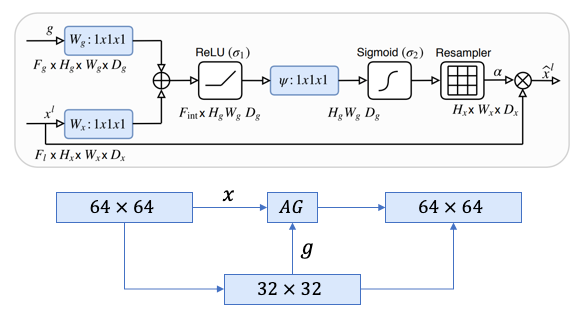

In [ ]:
tf.keras.backend.clear_session()

import tensorflow as tf
inputs = tf.keras.layers.Input(shape=(128, 128, 3))
c1 = conv(inputs, filters=64)
p1 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(c1)

c2 = conv(p1, filters=128)
p2 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(c2)

c3 = conv(p2, filters=256)
p3 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(c3)

c4 = conv(p3, filters=512)
attention1 = attention_gate(c4, c3)

up_sample1 = tf.keras.layers.UpSampling2D(size=(2, 2))(c4)
concat1 = tf.keras.layers.Concatenate(axis=3)([attention1, up_sample1])

c5 = conv(concat1, 128)
attention2 = attention_gate(c5, c2)

up_sample2 = tf.keras.layers.UpSampling2D(size=(2, 2))(c5)
concat2 = tf.keras.layers.Concatenate(axis=3)([attention2, up_sample2])

c6 = conv(concat2, 64)
attention3 = attention_gate(c6, c1)

up_sample3 = tf.keras.layers.UpSampling2D(size=(2, 2))(c6)
concat3 = tf.keras.layers.Concatenate(axis=3)([attention3, up_sample3])

c7 = conv(concat3, 64)

flattened = tf.keras.layers.Flatten()(c7)

dense0 = tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_normal')(flattened)

outputs = tf.keras.layers.Dense(4, activation='softmax')(dense0)

unet_attention = tf.keras.models.Model(inputs, outputs, name='attention-unet')


> Attention UNet

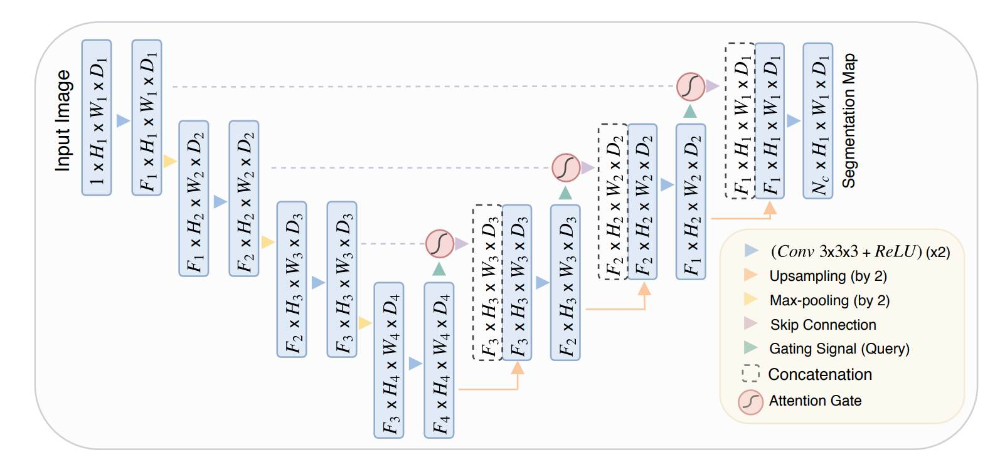

In [ ]:
unet_attention.summary()

Model: "attention-unet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 128, 128, 64)         0         ['batch_normaliza

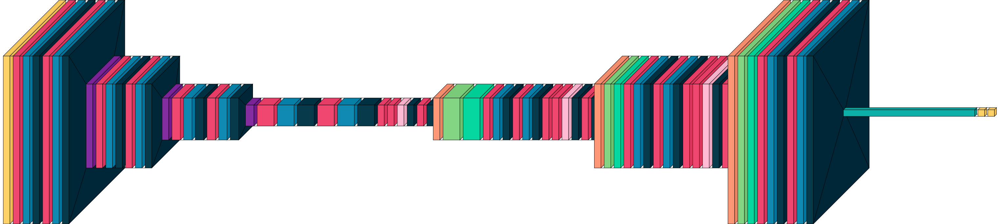

In [ ]:
visualkeras.layered_view(unet_attention)

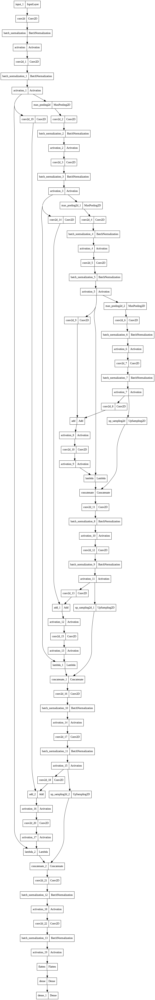

In [ ]:
tf.keras.utils.plot_model(unet_attention)

In [ ]:
optimizer = tf.keras.optimizers.Adam(5e-4)
unet_attention.compile(
    loss='categorical_crossentropy',
    optimizer=optimizer,
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        AUC(name='auc'),
        f1_score
    ]
)


In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.1,
                              patience=5,
                              min_lr=0.00001,
                              verbose=1)

In [ ]:
attention_model_history = unet_attention.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=10,
    callbacks=[early_stopping_cb, checkpoint_cb, reduce_lr, create_model_checkpoint(model_name=unet_attention.name)])  # adjust epochs as needed


Epoch 1/10
541/541 [==============================] - 296s 524ms/step - loss: 3.8400 - accuracy: 0.4743 - precision: 0.5280 - recall: 0.3444 - auc: 0.7283 - f1_score: 0.4126 - val_loss: 1.7128 - val_accuracy: 0.2215 - val_precision: 0.2000 - val_recall: 0.1606 - val_auc: 0.5978 - val_f1_score: 0.1777 - lr: 5.0000e-04
Epoch 2/10
541/541 [==============================] - 260s 481ms/step - loss: 0.8654 - accuracy: 0.6293 - precision: 0.7039 - recall: 0.5333 - auc: 0.8697 - f1_score: 0.6049 - val_loss: 0.7886 - val_accuracy: 0.6528 - val_precision: 0.7181 - val_recall: 0.5662 - val_auc: 0.8894 - val_f1_score: 0.6315 - lr: 5.0000e-04
Epoch 3/10
541/541 [==============================] - 216s 400ms/step - loss: 0.7447 - accuracy: 0.6978 - precision: 0.7622 - recall: 0.6295 - auc: 0.9086 - f1_score: 0.6888 - val_loss: 1.0341 - val_accuracy: 0.5697 - val_precision: 0.6222 - val_recall: 0.4903 - val_auc: 0.8279 - val_f1_score: 0.5473 - lr: 5.0000e-04
Epoch 4/10
541/541 [=======================

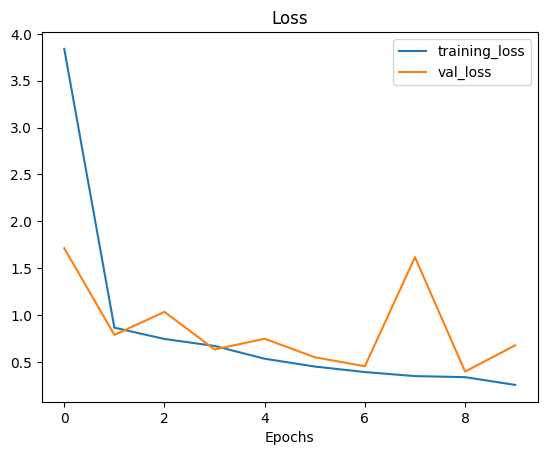

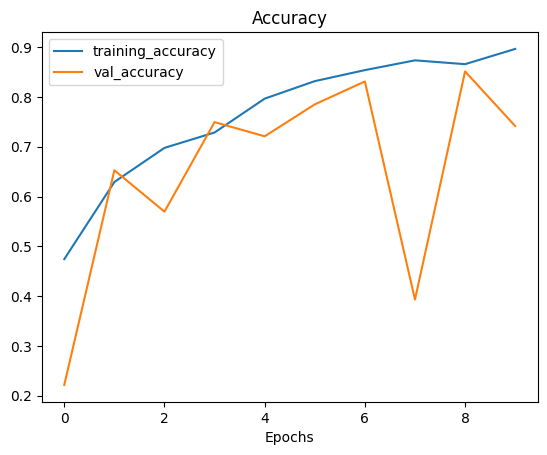

In [ ]:
plot_loss_curves(attention_model_history)

In [ ]:
create_confusion_matrix(unet_attention)

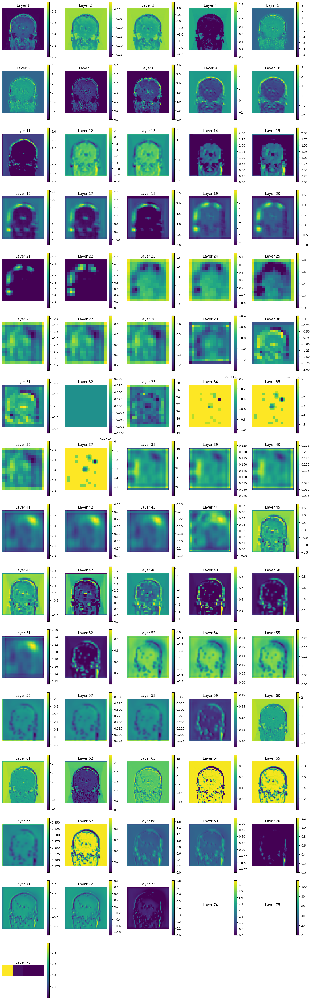

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import tensorflow as tf

# Get a batch of images from the validation generator
sample_batch = next(validation_generator)
sample_image = sample_batch[0][0]  # Get the first image from the batch

# Ensure the sample image is in the correct shape
sample_image = sample_image.reshape((1, *sample_image.shape))

# Define the predict function outside the loop to avoid retracing
@tf.function
def get_intermediate_output(intermediate_model, input_data):
    return intermediate_model(input_data)

# Determine the number of layers
num_layers = len(unet_attention.layers)

# Calculate the number of rows and columns for the subplots
num_cols = 5
num_rows = (num_layers // num_cols) + (1 if num_layers % num_cols != 0 else 0)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over layers
for i in range(num_layers):
    # Get the output of the current layer
    layer_output = unet_attention.layers[i].output

    # Create a new model that will return the output of the current layer given an input
    intermediate_model = Model(inputs=unet_attention.input, outputs=layer_output)

    # Get the output of the current layer
    intermediate_output = get_intermediate_output(intermediate_model, sample_image).numpy()

    # Handle different output shapes
    if len(intermediate_output.shape) == 4:  # For Conv2D layers
        output_image = intermediate_output[0, :, :, 0]
    elif len(intermediate_output.shape) == 2:  # For Dense layers
        output_image = intermediate_output[0].reshape((1, -1))  # Reshape to 2D for visualization
    else:
        continue  # Skip layers with unsupported output shapes

    # Visualize the output using plt.imshow
    ax = axes[i]  # Get the appropriate subplot
    ax.imshow(output_image, cmap='viridis')
    ax.set_title(f'Layer {i+1}')
    ax.axis('off')
    fig.colorbar(ax.imshow(output_image, cmap='viridis'), ax=ax)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Vision Transformers (ViT)

> Vision Transformer paper

Alexey Dosovitskiy, et al. "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale" (2020) https://arxiv.org/abs/2010.11929v2


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

# Clear session
tf.keras.backend.clear_session()

# PatchEncoder class
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patch):
        positions = tf.expand_dims(
            tf.range(start=0, limit=self.num_patches, delta=1), axis=0
        )
        projected_patches = self.projection(patch)
        encoded = projected_patches + self.position_embedding(positions)
        return encoded

    def get_config(self):
        config = super().get_config()
        config.update({"num_patches": self.num_patches, "projection_dim": self.projection.units})
        return config

# Function to extract patches from an image
def extract_patches(image, patch_size):
    if len(image.shape) == 3:
        image = tf.expand_dims(image, 0)  # Add batch dimension if missing

    sizes = [1, patch_size, patch_size, 1]
    strides = [1, patch_size, patch_size, 1]
    rates = [1, 1, 1, 1]

    patches = tf.image.extract_patches(
        images=image,
        sizes=sizes,
        strides=strides,
        rates=rates,
        padding='VALID'
    )

    return tf.reshape(patches, [-1, patch_size, patch_size, image.shape[-1]])

# Linear Projection of Flattened Patches
def lin_proj(patches, hidden_size, dropout_rate=0.4):
    x = tf.keras.layers.Flatten()(patches)
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    x = tf.keras.layers.Dense(hidden_size, activation='relu', kernel_initializer='he_normal')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    return x

# MLP of transformer encoder layer
def mlp(layer, size, dropout_rate=0.4):
    x = tf.keras.layers.Dense(size, activation='gelu')(layer)
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    x = tf.keras.layers.Dense(layer.shape[-1])(x)  # Match the input size for residual connection
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    return x

# Transformer Encoder
def transformer_encoder(layer, l, num_heads, key_dim, size):
    for _ in range(l):
        x = tf.keras.layers.LayerNormalization()(layer)
        x = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)(x, x)  # self-attention
        x = tf.keras.layers.Dropout(0.1)(x)  # Dropout for regularization
        added = tf.keras.layers.Add()([layer, x])
        x = tf.keras.layers.LayerNormalization()(added)
        x = mlp(x, size)
        layer = tf.keras.layers.Add()([added, x])
    return layer

# MLP Head layer for final classification
def mlp_head(layer, dropout_rate=0.4, output_dims=4):
    x = tf.keras.layers.Flatten()(layer)
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    x = tf.keras.layers.Dense(256, activation='gelu')(x)  # Optional dense layer for additional learning capacity
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    outputs = tf.keras.layers.Dense(output_dims, activation='softmax')(x)
    return outputs

# Model construction
def create_vit_model(input_shape, patch_size, hidden_size, l, num_heads, key_dim, mlp_size, output_dims, dropout_rate=0.4, name='model'):
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Extract patches
    patches = extract_patches(inputs, patch_size)

    # Linear projection of patches
    lin_proj_patches = lin_proj(patches, hidden_size, dropout_rate)

    # Add a batch dimension and reshape
    num_patches = (input_shape[0] // patch_size) * (input_shape[1] // patch_size)
    reshaped_patches = tf.reshape(lin_proj_patches, (-1, num_patches, hidden_size))

    # Encode patches using PatchEncoder
    encoded_patches = PatchEncoder(num_patches=num_patches, projection_dim=hidden_size)(reshaped_patches)

    # Transformer encoder
    encoded_patches = transformer_encoder(encoded_patches, l, num_heads, key_dim, mlp_size)

    # MLP head for final classification
    outputs = mlp_head(encoded_patches, dropout_rate, output_dims)

    # Create model
    model = tf.keras.models.Model(inputs=inputs, outputs=outputs, name=name)
    return model

# Parameters
input_shape = (128, 128, 3)
patch_size = 16
hidden_size = 256
l = 4
num_heads = 8
key_dim = 64
mlp_size = 256  # Should be the same as the hidden_size for consistency
output_dims = 4
dropout_rate = 0.4

# Create the model
vit_model = create_vit_model(input_shape, patch_size, hidden_size, l, num_heads, key_dim, mlp_size, output_dims, dropout_rate, name='vision_transformer')

# Compile the model
vit_model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        AUC(name='auc'),
        f1_score
    ]
)
# Summary of the model
vit_model.summary()


NameError: name 'Precision' is not defined

> Vision Transformer architecture

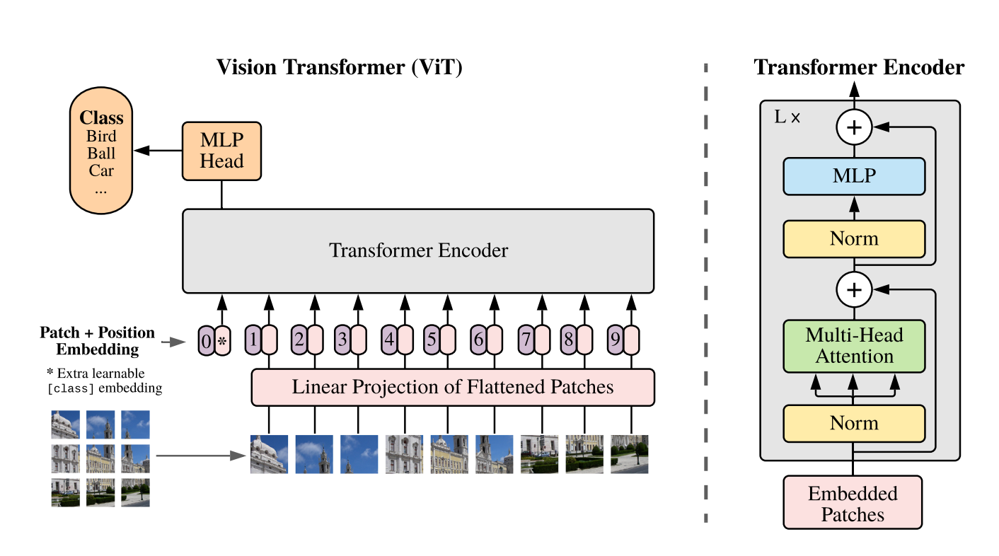

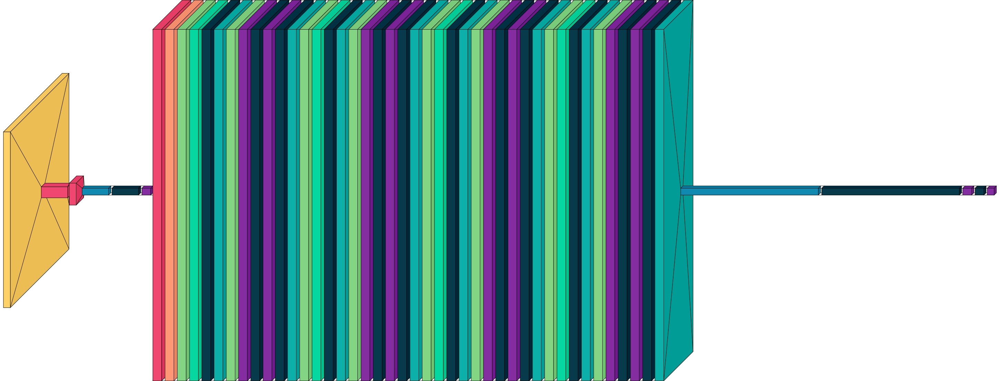

In [ ]:
visualkeras.layered_view(vit_model)

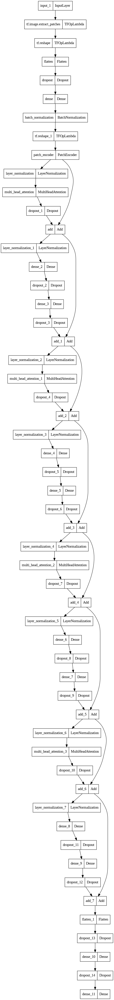

In [ ]:
tf.keras.utils.plot_model(vit_model)

In [ ]:
vit_history = vit_model.fit(                   # ikincidi bu
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=100,
    callbacks=[checkpoint_cb, reduce_lr, create_model_checkpoint(model_name=vit_model.name)])

Epoch 1/100
541/541 [==============================] - 60s 85ms/step - loss: 1.3195 - accuracy: 0.4359 - precision: 0.5682 - recall: 0.2192 - auc: 0.7312 - f1_score: 0.3079 - val_loss: 1.0443 - val_accuracy: 0.5183 - val_precision: 0.7370 - val_recall: 0.2167 - val_auc: 0.8042 - val_f1_score: 0.3301 - lr: 0.0010
Epoch 2/100
541/541 [==============================] - 51s 94ms/step - loss: 1.0774 - accuracy: 0.5040 - precision: 0.6510 - recall: 0.3008 - auc: 0.7928 - f1_score: 0.4055 - val_loss: 1.0199 - val_accuracy: 0.5417 - val_precision: 0.6285 - val_recall: 0.4495 - val_auc: 0.8303 - val_f1_score: 0.5220 - lr: 0.0010
Epoch 3/100
541/541 [==============================] - 35s 65ms/step - loss: 1.0553 - accuracy: 0.5088 - precision: 0.6587 - recall: 0.3079 - auc: 0.7995 - f1_score: 0.4134 - val_loss: 1.0425 - val_accuracy: 0.5602 - val_precision: 0.7421 - val_recall: 0.2498 - val_auc: 0.8163 - val_f1_score: 0.3700 - lr: 0.0010
Epoch 4/100
541/541 [==============================] - 44s

KeyboardInterrupt: 

In [ ]:
vit_history = vit_model.fit(train_generator, epochs=50, validation_data=validation_generator,        # evvelkidi
                            callbacks=[create_model_checkpoint(model_name=vit_model.name)])

Epoch 1/50
542/542 [==============================] - 37s 68ms/step - loss: 1.1910 - accuracy: 0.4652 - val_loss: 1.4992 - val_accuracy: 0.4819
Epoch 2/50
542/542 [==============================] - 30s 55ms/step - loss: 1.1154 - accuracy: 0.5025 - val_loss: 2.1076 - val_accuracy: 0.4844
Epoch 3/50
542/542 [==============================] - 30s 55ms/step - loss: 1.0746 - accuracy: 0.5281 - val_loss: 2.3269 - val_accuracy: 0.4817
Epoch 4/50
542/542 [==============================] - 35s 65ms/step - loss: 1.0344 - accuracy: 0.5569 - val_loss: 2.5689 - val_accuracy: 0.4840
Epoch 5/50
542/542 [==============================] - 30s 55ms/step - loss: 1.0027 - accuracy: 0.5621 - val_loss: 2.3541 - val_accuracy: 0.4872
Epoch 6/50
542/542 [==============================] - 35s 65ms/step - loss: 0.9670 - accuracy: 0.5822 - val_loss: 2.5550 - val_accuracy: 0.4920
Epoch 7/50
542/542 [==============================] - 30s 55ms/step - loss: 0.9464 - accuracy: 0.5933 - val_loss: 1.9742 - val_accuracy:

In [ ]:
create_confusion_matrix(vit_model)

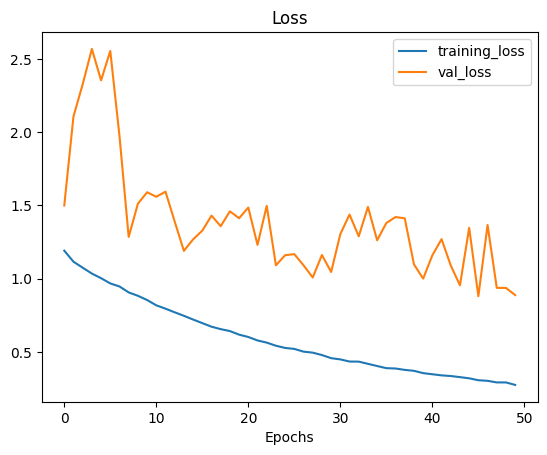

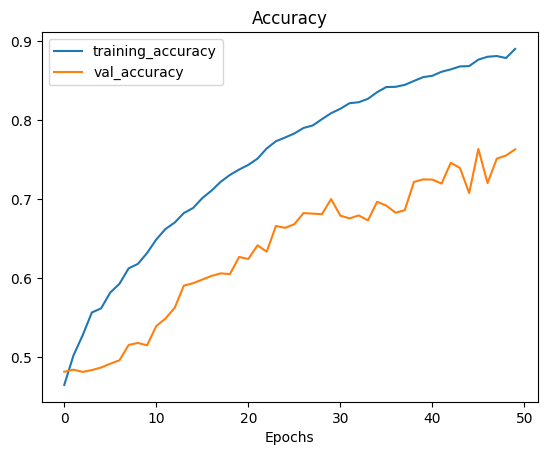

In [ ]:
plot_loss_curves(vit_history)

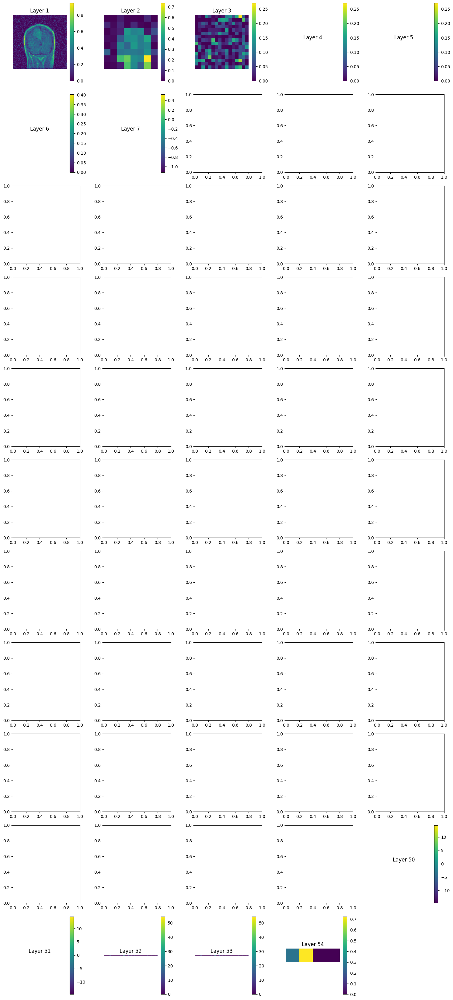

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import tensorflow as tf

# Get a batch of images from the validation generator
sample_batch = next(validation_generator)
sample_image = sample_batch[0][0]  # Get the first image from the batch

# Ensure the sample image is in the correct shape
sample_image = sample_image.reshape((1, *sample_image.shape))

# Define the predict function outside the loop to avoid retracing
@tf.function
def get_intermediate_output(intermediate_model, input_data):
    return intermediate_model(input_data)

# Determine the number of layers
num_layers = len(vit_model.layers)

# Calculate the number of rows and columns for the subplots
num_cols = 5
num_rows = (num_layers // num_cols) + (1 if num_layers % num_cols != 0 else 0)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over layers
for i in range(num_layers):
    # Get the output of the current layer
    layer_output = vit_model.layers[i].output

    # Create a new model that will return the output of the current layer given an input
    intermediate_model = Model(inputs=vit_model.input, outputs=layer_output)

    # Get the output of the current layer
    intermediate_output = get_intermediate_output(intermediate_model, sample_image).numpy()

    # Handle different output shapes
    if len(intermediate_output.shape) == 4:  # For Conv2D layers
        output_image = intermediate_output[0, :, :, 0]
    elif len(intermediate_output.shape) == 2:  # For Dense layers
        output_image = intermediate_output[0].reshape((1, -1))  # Reshape to 2D for visualization
    else:
        continue  # Skip layers with unsupported output shapes

    # Visualize the output using plt.imshow
    ax = axes[i]  # Get the appropriate subplot
    ax.imshow(output_image, cmap='viridis')
    ax.set_title(f'Layer {i+1}')
    ax.axis('off')
    fig.colorbar(ax.imshow(output_image, cmap='viridis'), ax=ax)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Recurrent-UNet

> Recurrent UNet paper

Wei Wang, Kaicheng Yu, Joachim Hugonot, Pascal Fua, Mathieu Salzmann
, et al. "Recurrent U-Net for Resource-Constrained Segmentation
" (2019) https://arxiv.org/abs/1906.04913


Flexible Architecture: The Recurrent U-Net can be adapted to various tasks beyond medical imaging, such as video frame prediction, where the temporal aspect is critical.


In [ ]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Create building blocks
def conv_block(inputs, n_filters=64, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same'):
  x = tf.keras.layers.Conv2D(filters=n_filters, kernel_size=kernel_size, activation=activation, kernel_initializer=kernel_initializer, padding=padding)(inputs)
  x = tf.keras.layers.GroupNormalization(groups=min(32, n_filters // 4))(x)
  x = tf.keras.layers.Activation('relu')(x)
  x = tf.keras.layers.Conv2D(filters=n_filters, kernel_size=kernel_size, activation=activation, kernel_initializer=kernel_initializer, padding=padding)(x)
  x = tf.keras.layers.GroupNormalization(groups=min(32, n_filters // 4))(x)
  x = tf.keras.layers.Activation('relu')(x)

  return x

def up_block(input_1, input_2, n_filters=64, kernel_size=(3, 3), activation='relu', kernel_initializer='he_normal', padding='same'):
  x = tf.keras.layers.Conv2DTranspose(filters=n_filters, kernel_size=kernel_size, activation=activation, kernel_initializer=kernel_initializer, padding=padding)(input_1)
  x = tf.image.resize(x, size=tf.shape(input_2)[1:3])
  concat = tf.keras.layers.Concatenate()([x, input_2])
  output = conv_block(concat)

  return output

def funcs(input):
  conv1 = conv_block(input)
  max_pool = tf.keras.layers.MaxPool2D(pool_size=(1, 1), padding='valid')(conv1)
  conv2 = conv_block(max_pool)
  output = up_block(conv1, conv2, n_filters=32)

  return output

def recurrent_block(h_prev, e, dual=True):
  h_prev_resized = tf.image.resize(h_prev, size=tf.shape(e)[1:3])

  if dual==True:
    fz = funcs(e)
    fz_sigmoid = tf.keras.layers.Activation('sigmoid')(fz)
    fr = funcs(e)
    fr_sigmoid = tf.keras.layers.Activation('sigmoid')(fr)

    multiply_0 = tf.keras.layers.Multiply()([fz_sigmoid, h_prev_resized])

    fr_sigmoid_resized = tf.image.resize(fr_sigmoid, size=tf.shape(e)[1:3])

    multiply_1 = tf.keras.layers.Multiply()([fr_sigmoid_resized, e])
    fh = funcs(multiply_1)
    tan = tf.keras.layers.Activation('tanh')(fh)

    one_minus_fz = tf.keras.layers.Lambda(lambda x: 1.0 - x)(fz)
    multiply_2 = tf.keras.layers.Multiply()([one_minus_fz, tan])
    ht = tf.keras.layers.Add()([multiply_0, multiply_2])
    dt = conv_block(ht)

    return ht, dt

  else:
    fz = funcs(e)
    fz_sigmoid = tf.keras.layers.Activation('sigmoid')(fz)

    fh = funcs(e)
    tan = tf.keras.layers.Activation('tanh')(fh)

    multiply_0 = tf.keras.layers.Multiply()([fz_sigmoid, h_prev])
    one_minus_fz = tf.keras.layers.Lambda(lambda x: 1.0 - x)(fz)
    multiply_1 = tf.keras.layers.Multiply()([one_minus_fz, tan])
    ht = tf.keras.layers.Add()([multiply_0, multiply_1])
    dt = conv_block(ht)

    return ht, dt


# Create R-Unet model
tf.keras.backend.clear_session()


inputs = tf.keras.layers.Input(shape=(128, 128, 3))
st_prev = tf.zeros(shape=(0, 128, 128, 3), dtype=np.float32)

cat = tf.keras.layers.Concatenate(axis=0)([inputs, st_prev])
conv1 = conv_block(cat, n_filters=16)
max_pool1 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv1)
conv2 = conv_block(max_pool1, n_filters=32)
max_pool2 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv2)
conv3 = conv_block(max_pool2, n_filters=64, padding='same')
max_pool3 = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(conv3)

ht_prev = tf.zeros(shape=(1, 32, 32, 64))

ht_prev, dt = recurrent_block(ht_prev, max_pool3)


up_samp1 = up_block(conv3, dt)
up_samp2 = up_block(conv2, up_samp1)
up_samp3 = up_block(conv1, up_samp2)


conv4 = conv_block(up_samp3, activation='softmax')
st_prev = conv4

flatten = tf.keras.layers.Flatten()(conv4)

dense0 = tf.keras.layers.Dense(128, activation='relu')(flatten)
outputs = tf.keras.layers.Dense(4, activation='softmax')(dense0)

r_unet = tf.keras.Model(inputs, outputs, name='R-UNet')


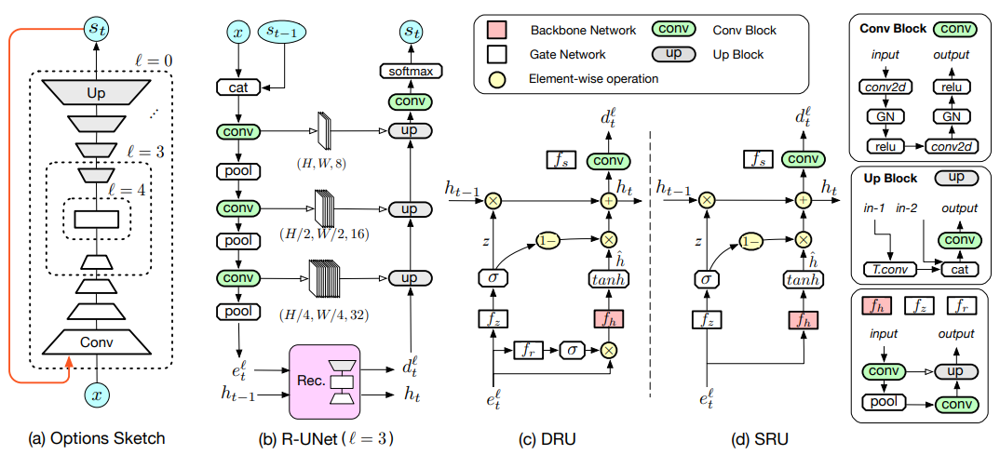

In [ ]:
r_unet.summary()

Model: "R-UNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 concatenate (Concatenate)   (None, 128, 128, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 16)         448       ['concatenate[0][0]']         
                                                                                                  
 group_normalization (Group  (None, 128, 128, 16)         32        ['conv2d[0][0]']              
 Normalization)                                                                              

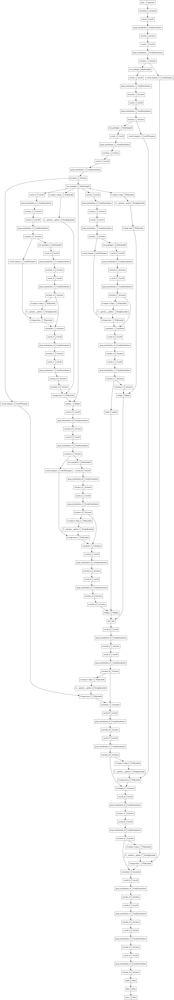

In [ ]:
tf.keras.utils.plot_model(r_unet)

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, AUC

import tensorflow as tf
from tensorflow.keras import backend as K

def f1_score(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2 * ((precision * recall) / (precision + recall + K.epsilon()))

optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

r_unet.compile(
    loss='categorical_crossentropy',
    optimizer=optimizer,
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        AUC(name='auc'),
        f1_score
    ]
)


In [ ]:
r_unet_history = r_unet.fit(train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=10,
    callbacks=[create_model_checkpoint(model_name=vit_model.name)])

Epoch 1/10
541/541 [==============================] - 147s 203ms/step - loss: 0.6352 - accuracy: 0.7342 - precision: 0.7892 - recall: 0.6739 - auc: 0.9297 - f1_score: 0.7154 - val_loss: 0.3741 - val_accuracy: 0.8623 - val_precision: 0.8772 - val_recall: 0.8449 - val_auc: 0.9747 - val_f1_score: 0.8605
Epoch 2/10
541/541 [==============================] - 99s 183ms/step - loss: 0.2127 - accuracy: 0.9237 - precision: 0.9321 - recall: 0.9159 - auc: 0.9913 - f1_score: 0.9237 - val_loss: 0.1931 - val_accuracy: 0.9317 - val_precision: 0.9382 - val_recall: 0.9273 - val_auc: 0.9923 - val_f1_score: 0.9326
Epoch 3/10
541/541 [==============================] - 98s 182ms/step - loss: 0.0866 - accuracy: 0.9710 - precision: 0.9730 - recall: 0.9692 - auc: 0.9982 - f1_score: 0.9710 - val_loss: 0.1612 - val_accuracy: 0.9431 - val_precision: 0.9451 - val_recall: 0.9403 - val_auc: 0.9944 - val_f1_score: 0.9427
Epoch 4/10
541/541 [==============================] - 78s 144ms/step - loss: 0.0538 - accuracy: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
import tensorflow as tf

# Get a batch of images from the validation generator
sample_batch = next(validation_generator)
sample_image = sample_batch[0][0]  # Get the first image from the batch

# Ensure the sample image is in the correct shape
sample_image = sample_image.reshape((1, *sample_image.shape))

# Define the predict function outside the loop to avoid retracing
@tf.function
def get_intermediate_output(intermediate_model, input_data):
    return intermediate_model(input_data)

# Determine the number of layers
num_layers = len(r_unet.layers)

# Calculate the number of rows and columns for the subplots
num_cols = 5
num_rows = (num_layers // num_cols) + (1 if num_layers % num_cols != 0 else 0)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over layers
for i in range(num_layers):
    # Get the output of the current layer
    layer_output = r_unet.layers[i].output

    # Create a new model that will return the output of the current layer given an input
    intermediate_model = Model(inputs=r_unet.input, outputs=layer_output)

    # Get the output of the current layer
    intermediate_output = get_intermediate_output(intermediate_model, sample_image).numpy()

    # Handle different output shapes
    if len(intermediate_output.shape) == 4:  # For Conv2D layers
        output_image = intermediate_output[0, :, :, 0]
    elif len(intermediate_output.shape) == 2:  # For Dense layers
        output_image = intermediate_output[0].reshape((1, -1))  # Reshape to 2D for visualization
    else:
        continue  # Skip layers with unsupported output shapes

    # Visualize the output using plt.imshow
    ax = axes[i]  # Get the appropriate subplot
    ax.imshow(output_image, cmap='viridis')
    ax.set_title(f'Layer {i+1}')
    ax.axis('off')
    fig.colorbar(ax.imshow(output_image, cmap='viridis'), ax=ax)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# All models comparison

In [ ]:
# List of model histories
histories = {
    'Baseline': history,
    'U-Net': model_unet_history,
    'Inception': inception_model_history,
    'Attention': attention_model_history,
    'ViT': vit_history,
    'Recurrent U-Net': r_unet_history
}

# Extract data for plotting
epochs = range(1, len(history['accuracy']) + 1)
model_names = list(histories.keys())

# Plot accuracy
plt.figure(figsize=(12, 6))
for model_name, hist in histories.items():
    plt.plot(epochs, hist['accuracy'], label=f'{model_name} Accuracy')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.legend()
plt.grid(True)
plt.show()

# Plot loss
plt.figure(figsize=(12, 6))
for model_name, hist in histories.items():
    plt.plot(epochs, hist['loss'], label=f'{model_name} Loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss Comparison')
plt.legend()
plt.grid(True)
plt.show()

# Implementing 'YOLO' from scratch

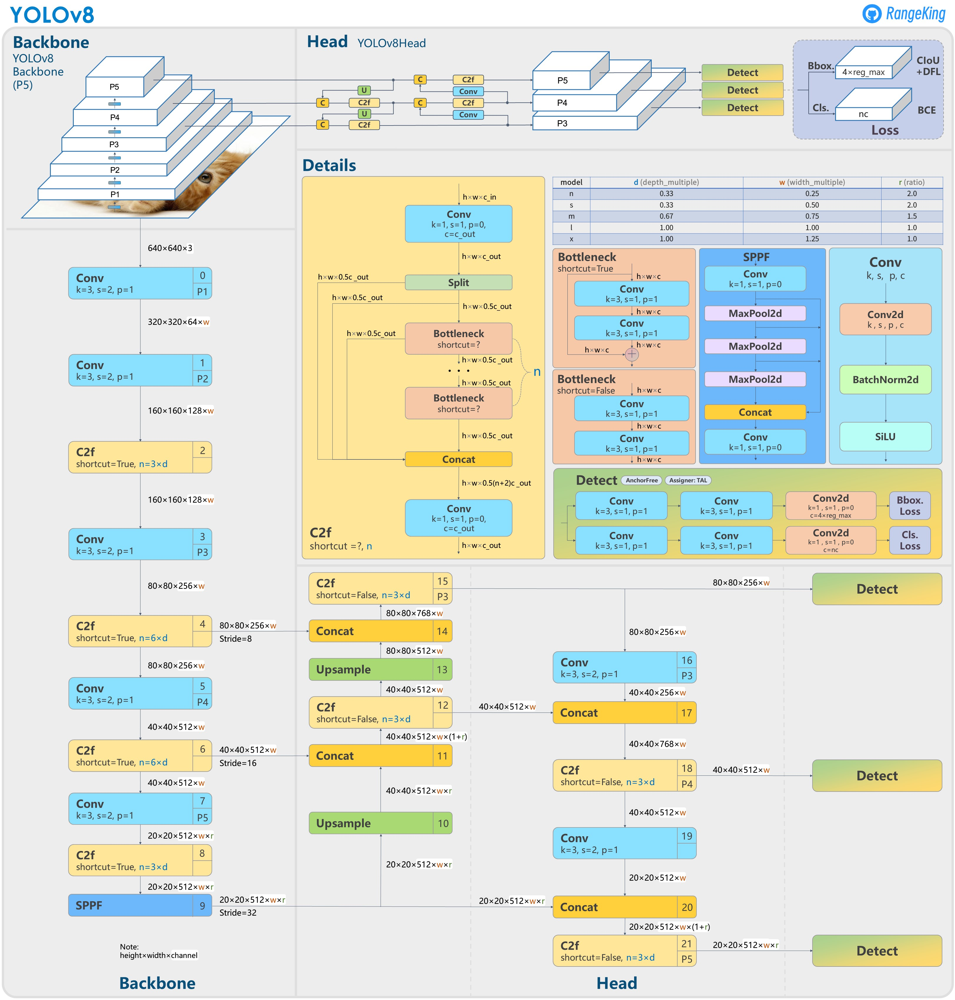

In [ ]:
import tensorflow as tf

tf.keras.backend.clear_session()

def conv_block(init_layer, k=3, s=1, p='same', c=32):
    x = tf.keras.layers.Conv2D(filters=c, kernel_size=k, strides=s, padding=p)(init_layer)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.activations.swish(x)
    return x

def bottleneck(init_layer, k=3, s=1, p='same', shortcut=True):
    c = init_layer.shape[-1]
    x = conv_block(init_layer, k=3, s=1, p='same', c=c)
    x = conv_block(x, k=3, s=1, p='same', c=c)
    if shortcut:
        return tf.keras.layers.Add()([init_layer, x])
    else:
        return x

def sppf(init_layer, k=1, s=1, p='same'):
    x = conv_block(init_layer, k=k, s=s, p=p)
    max_pool0 = tf.keras.layers.MaxPooling2D(pool_size=5, strides=1, padding='same')(x)
    concat_0 = tf.keras.layers.Concatenate(axis=-1)([x, max_pool0])

    max_pool1 = tf.keras.layers.MaxPooling2D(pool_size=9, strides=1, padding='same')(concat_0)
    concat_1 = tf.keras.layers.Concatenate(axis=-1)([concat_0, max_pool1])

    max_pool2 = tf.keras.layers.MaxPooling2D(pool_size=13, strides=1, padding='same')(concat_1)
    concat_2 = tf.keras.layers.Concatenate(axis=-1)([concat_1, max_pool2])

    output = conv_block(concat_2, k=k, s=s, p=p)
    return output

def detect(init_layer, reg_max, nc):
    x = conv_block(init_layer, k=3, s=1, p='same')
    y = conv_block(init_layer, k=3, s=1, p='same')
    x = conv_block(x, k=3, s=1, p='same')
    y = conv_block(y, k=3, s=1, p='same')
    bbox_loss = tf.keras.layers.Conv2D(filters=4 * reg_max, kernel_size=1, strides=1, padding='same')(x)
    cls_loss = tf.keras.layers.Conv2D(filters=nc, kernel_size=1, strides=1, padding='same')(y)
    return bbox_loss, cls_loss

def split_layer(x):
    channels = x.shape[-1]
    half_channels = channels // 2
    return x[:, :, :, :half_channels], x[:, :, :, half_channels:]

def c2f(init_layer, c_out, n_bottlenecks, shortcut=True):
    x = conv_block(init_layer, c=c_out, k=1, s=1, p='same')
    split_1, split_2 = split_layer(x)
    x = bottleneck(split_2, k=3, shortcut=shortcut)
    concat_0 = tf.keras.layers.Concatenate(axis=-1)([split_1, x])
    for _ in range(n_bottlenecks - 1):
        x = bottleneck(concat_0, k=3, shortcut=shortcut)
        concat_0 = tf.keras.layers.Concatenate(axis=-1)([split_1, x])
    alpha = conv_block(concat_0, k=1, s=1, p='same', c=c_out)
    return alpha

# Custom layer for resizing tensors
class ResizeLayer(tf.keras.layers.Layer):
    def __init__(self, target_shape, **kwargs):
        super(ResizeLayer, self).__init__(**kwargs)
        self.target_shape = target_shape

    def call(self, inputs):
        return tf.image.resize(inputs, self.target_shape)

def adjust_for_concatenation(tensor1, tensor2):
    target_shape = tensor2.shape[1:3]  # Get height and width from tensor2
    resize_layer = ResizeLayer(target_shape)
    tensor1_resized = resize_layer(tensor1)
    return tensor1_resized


# Define parameters
d_n = 1 / 3
c_out = 64
reg_max = 16  # Example value
nc = 2  # Example value
w = 0.25  # Channel multiplier
r = 2  # Stride multiplier

inputs = tf.keras.layers.Input(shape=(640, 640, 3))
p0 = conv_block(inputs, k=3, s=2, p='same', c=int(64 * w))
p1 = conv_block(p0, k=3, s=2, p='same', c=int(128 * w))
p2 = c2f(p1, int(c_out * w), int(d_n * 3))
p3 = conv_block(p2, k=3, s=2, p='same', c=int(256 * w))
p4 = c2f(p3, int(c_out * w), int(d_n * 6))
p5 = conv_block(p4, k=3, s=2, p='same', c=int(512 * w))
p6 = c2f(p5, int(c_out * w), int(d_n * 6))
p7 = conv_block(p6, k=3, s=2, p='same', c=int(512 * w * r))
p8 = c2f(p7, int(c_out * w), int(d_n * 3))
p9 = sppf(p8)
p10 = tf.keras.layers.Conv2DTranspose(filters=int(p9.shape[-1]), kernel_size=3, padding='same')(p9)

# Adjust for concatenation
p10_resized = adjust_for_concatenation(p10, p6)

p11 = tf.keras.layers.Concatenate(axis=-1)([p6, p10_resized])
p12 = c2f(p11, int(c_out * w), int(d_n * 3), shortcut=False)
p13 = tf.keras.layers.Conv2DTranspose(filters=int(p12.shape[-1]), kernel_size=3, padding='same')(p12)

# Adjust for concatenation
p13_resized = adjust_for_concatenation(p13, p4)

p14 = tf.keras.layers.Concatenate(axis=-1)([p4, p13_resized])
p15 = c2f(p14, int(c_out * w), int(d_n * 3), shortcut=False)
p16 = conv_block(p15, k=3, s=2, p='same', c=int(256 * w))
p17 = tf.keras.layers.Concatenate(axis=-1)([p12, p16])
p18 = c2f(p17, int(c_out * w), int(d_n * 3), shortcut=False)
p19 = conv_block(p18, k=3, s=2, p='same', c=int(512 * w))
p20 = tf.keras.layers.Concatenate(axis=-1)([p9, p19])
p21 = c2f(p20, int(c_out * w), int(d_n * 3), shortcut=False)

# Detection heads
detect1 = detect(p15, reg_max=reg_max, nc=nc)
detect2 = detect(p18, reg_max=reg_max, nc=nc)
detect3 = detect(p21, reg_max=reg_max, nc=nc)

yolo_v8 = tf.keras.Model(inputs=inputs, outputs=[detect1, detect2, detect3])

yolo_v8.summary()


In [ ]:
tf.keras.utils.plot_model(yolo_v8, show_shapes=True)

# Object Detection with 'YOLO'

In [ ]:
!wget https://raw.githubusercontent.com/databyhuseyn/DeepLearning/main/helper_functions.py

--2024-08-16 08:43:00--  https://raw.githubusercontent.com/databyhuseyn/DeepLearning/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2024-08-16 08:43:00 (85.6 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [ ]:
from helper_functions import unzip_data, walk_through_dir, plot_loss_curves

In [ ]:
!kaggle datasets download -d davidbroberts/brain-tumor-object-detection-datasets

Dataset URL: https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets
License(s): CC0-1.0
100% 12.3M/12.3M [00:01<00:00, 14.8MB/s]
100% 12.3M/12.3M [00:01<00:00, 8.23MB/s]


In [ ]:
unzip_data('/content/brain-tumor-object-detection-datasets.zip')

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 3.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [ ]:
from ultralytics import YOLO

In [ ]:
!yolo task=detect mode=train model=yolov8n.pt data= '/content/sagittal_t1wce_2_class/sagittal_t1wce_2_class.yaml' epochs=15 imgsz=256 plots=True

100% 6.25M/6.25M [00:00<00:00, 212MB/s]
Ultralytics YOLOv8.2.78 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/sagittal_t1wce_2_class/sagittal_t1wce_2_class.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

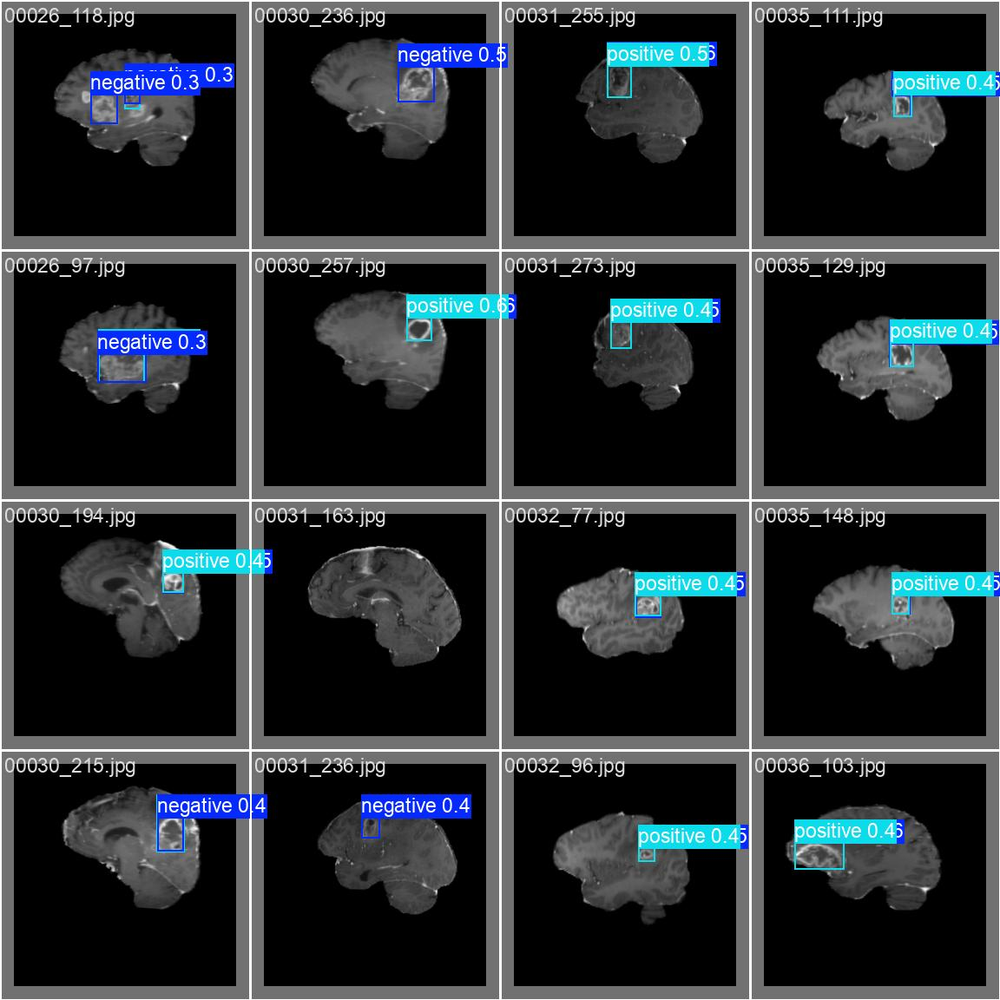